# Parametric simplification of street network geometry

## Process

1. Consolidate highways
2. Consolidate nodes
3. Consolidate edges

### Consolidate highways

Highways are normally represted by parallel lines. Those are linked together using Queen contiguity and ballpark assessment of paralelism and each component (two parallel sequences of linestrings) are averaged. Previously attached geometries are snapped to nodes of a new geometry to preserve topology.

### Consolidate nodes

DBSCAN identifies clusters of nodes and each cluster is replaced by the average node (mean of coordinates). Street geometries wihtin `tolerance` are cut and directly attached to the new node (generates spider-like geometry).

### Consolidate edges

Selection of edges to be consolidated is based on size and shape of enclosure polygons. As shown below, target polygons are determined as a function of `area` and `circular compactness`. The criteria can be reflected using a derived index of consolidation $C$:

$$
C=\sqrt{a} * \sqrt{c_c}
$$

where $a$ is an area of a polygon and

$$
c_c = \frac{a}{a_c}
$$

where $a_c$ is an area of an enclosing circle of a polygon.

That can be further simplified into a direct index:

$$
C=\frac{a}{\sqrt{a_c}}
$$

To select edges for consolidation we need to specify maximum value of $C$, which can be often derived from a distribution of $C$ which tends to be bimodal.

In [402]:
from itertools import combinations
import collections

import pygeos
import numpy as np
import pandas as pd
import geopandas as gpd
import momepy as mm
import osmnx as ox
import contextily as ctx

from shapely.ops import polygonize
from scipy.spatial import Voronoi
from sklearn.cluster import KMeans
from sklearn import preprocessing
from clustergram import Clustergram
from libpysal.weights import Queen, W, w_union
from shapely.geometry import LineString
import mapclassify as mc
import matplotlib.pyplot as plt

from consolidate import *
from consolidate import _average_geometry, _get_line

## Houston

CPU times: user 1min 22s, sys: 2.15 s, total: 1min 24s
Wall time: 1min 32s
CPU times: user 45.8 s, sys: 221 ms, total: 46 s
Wall time: 46.2 s
CPU times: user 1min 8s, sys: 94.4 ms, total: 1min 8s
Wall time: 1min 8s
CPU times: user 6.35 s, sys: 297 ms, total: 6.65 s
Wall time: 6.26 s


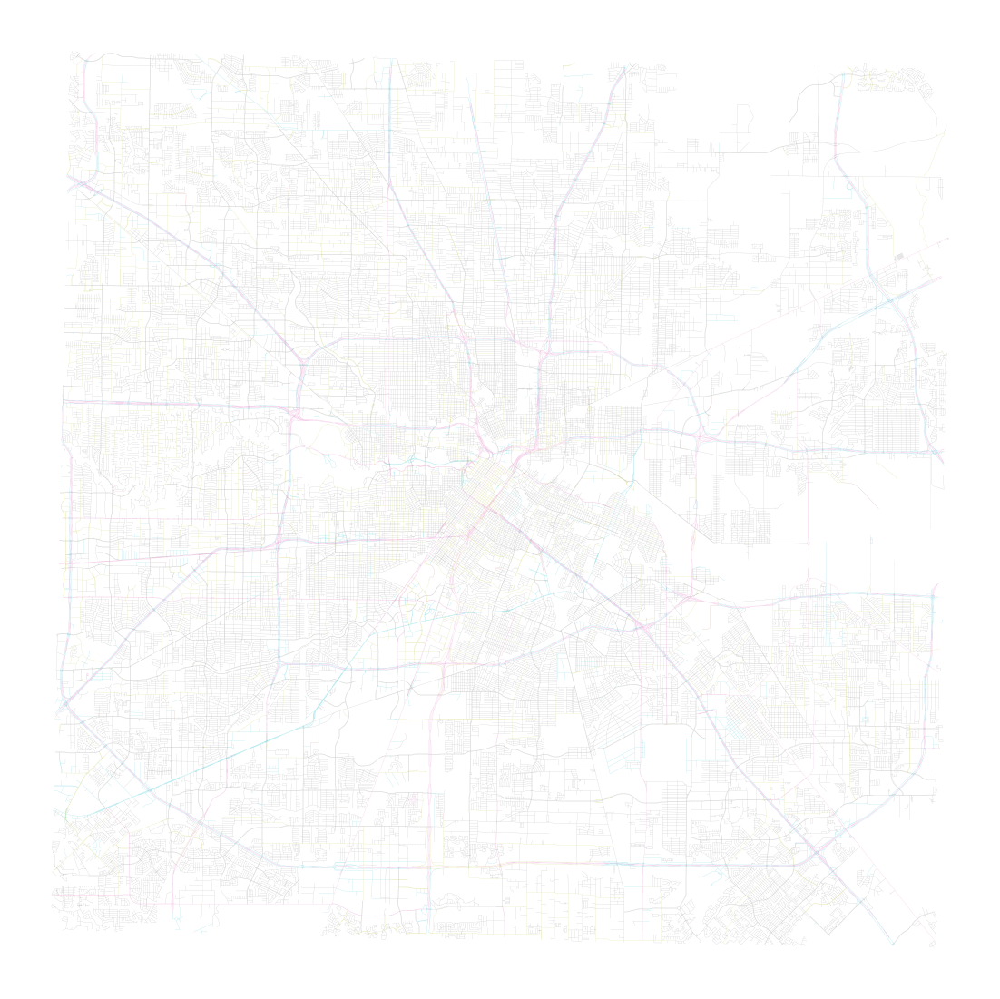

In [2]:
point = (29.74807, -95.35584)
dist = 20000

%time streets_graph = ox.graph_from_point(point, dist, network_type='drive')
%time streets_graph = ox.projection.project_graph(streets_graph)
%time gdf = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)
%time gdf.plot(gdf.highway.astype(str), figsize=(20, 20), linewidth=.1).set_axis_off()

In [3]:
%%time
fixed_highways = highway_fix(gdf, tick_length=100, allowed_error=5, tolerance=25)

KeyboardInterrupt: 

In [5]:
%%time
network, midpoints = consolidate_nodes(gpd.GeoDataFrame(geometry=gdf.geometry), tolerance=30)

CPU times: user 31min 23s, sys: 2.08 s, total: 31min 25s
Wall time: 31min 25s


In [379]:
%%time
polygonized = polygonize(network.geometry.unary_union)
polygons = gpd.GeoDataFrame(geometry=[g for g in polygonized], crs=network.crs)

CPU times: user 51.7 s, sys: 299 ms, total: 52 s
Wall time: 52.3 s


In [380]:
%time polygons['area'] = polygons.area
%time polygons['circom'] = mm.CircularCompactness(polygons, 'area').series

CPU times: user 29.6 ms, sys: 3.03 ms, total: 32.7 ms
Wall time: 34 ms
CPU times: user 5.01 s, sys: 64 ms, total: 5.08 s
Wall time: 5.11 s


(0.0, 50000.0)

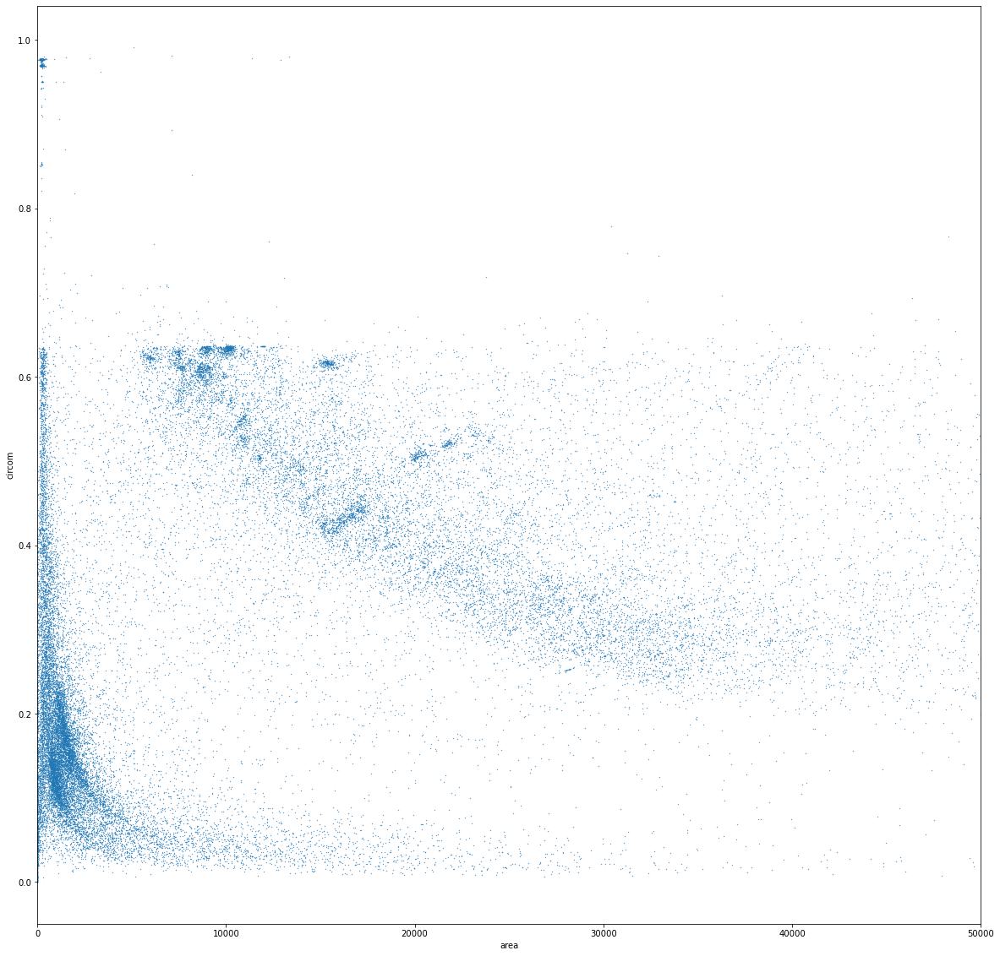

In [381]:
ax = polygons[['circom', 'area']].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
ax.set_xlim(0, 50000)
# ax.set_ylim(0, 2500)

In [13]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PowerTransformer, RobustScaler

In [181]:
data = polygons[['area', 'circom']]

scaler = RobustScaler()
scaled = scaler.fit_transform(data)

(-0.5, 2.0)

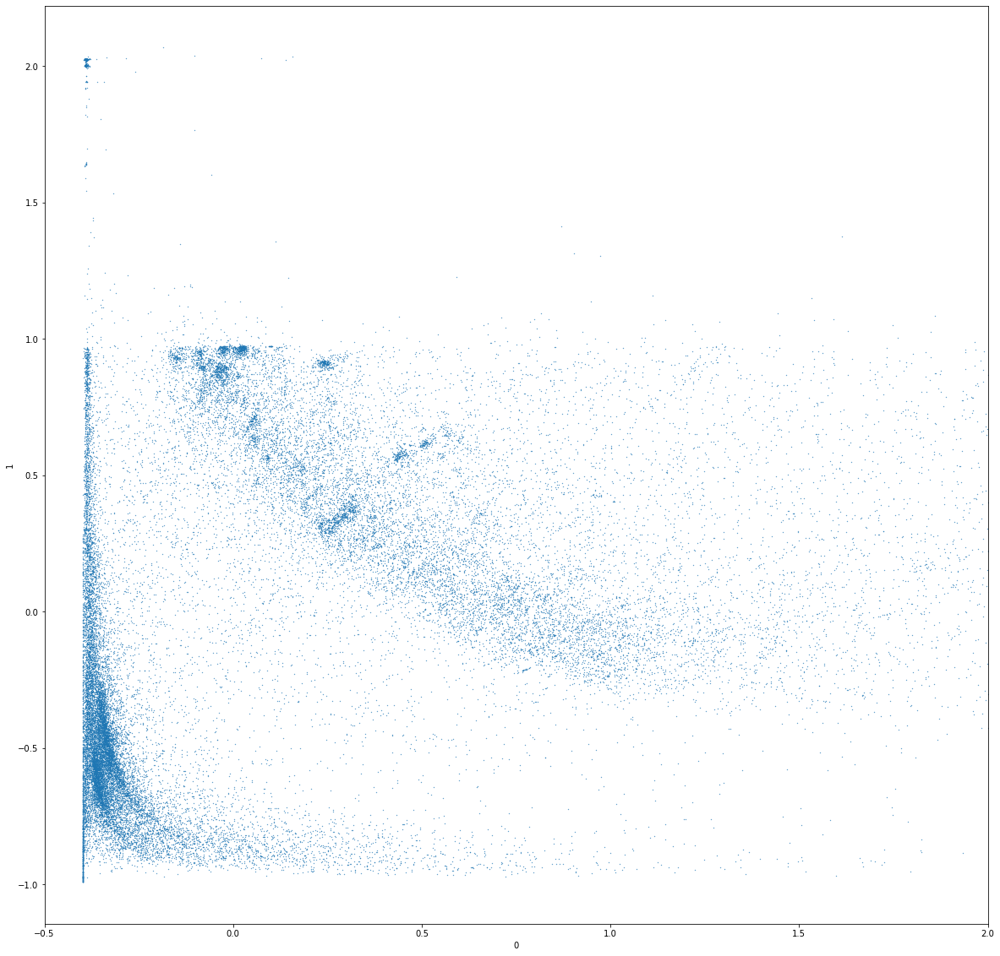

In [182]:
ax = pd.DataFrame(scaled).plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
ax.set_xlim(-.5, 2)

In [31]:
db = DBSCAN(eps=.025, min_samples=10).fit(scaled)
np.unique(db.labels_, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
        16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
        33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
        50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66,
        67, 68, 69, 70, 71, 72, 73, 74, 75]),
 array([ 7416, 13915, 17458,    22,    21,    83,    33,    14,    27,
           30,    31,    29,    15,    10,    15,    16,   138,    17,
           86,    14,     9,    20,    18,    33,    17,    10,    13,
           32,    15,    17,    16,    29,    14,    17,    15,    14,
           11,    16,    15,    15,    23,    11,    14,    16,    14,
           12,    10,    23,    13,    10,    13,    12,    12,    11,
           13,     7,    20,    10,    10,    11,    10,    11,    10,
           10,    10,     8,    10,    10,   398,    10,    14,     8,
           11,     6,    12,    10,    10]))

(0.0, 50000.0)

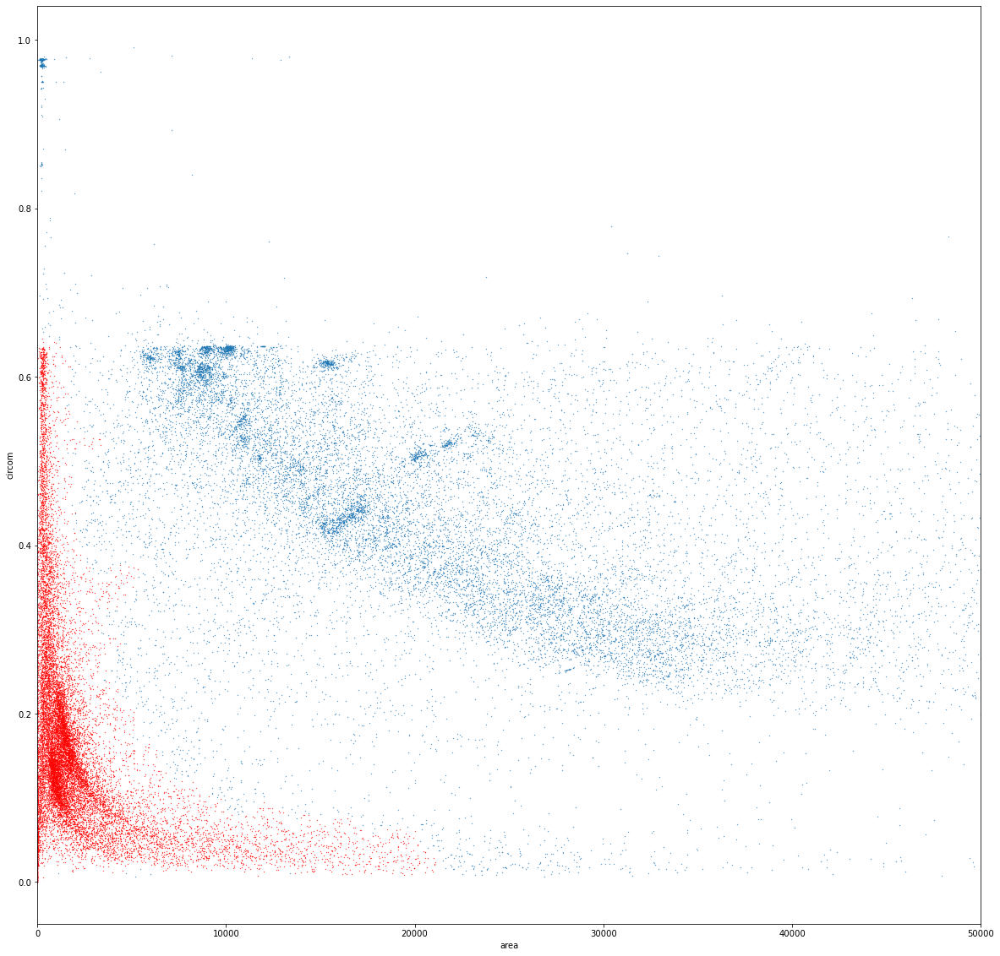

In [36]:
ax = polygons[['circom', 'area']][db.labels_ != 1].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
polygons[['circom', 'area']][db.labels_ == 1].plot.scatter('area', 'circom', ax=ax, color='r', s=.1)
ax.set_xlim(0, 50000)
# ax.set_ylim(0, 2500)

<AxesSubplot:>

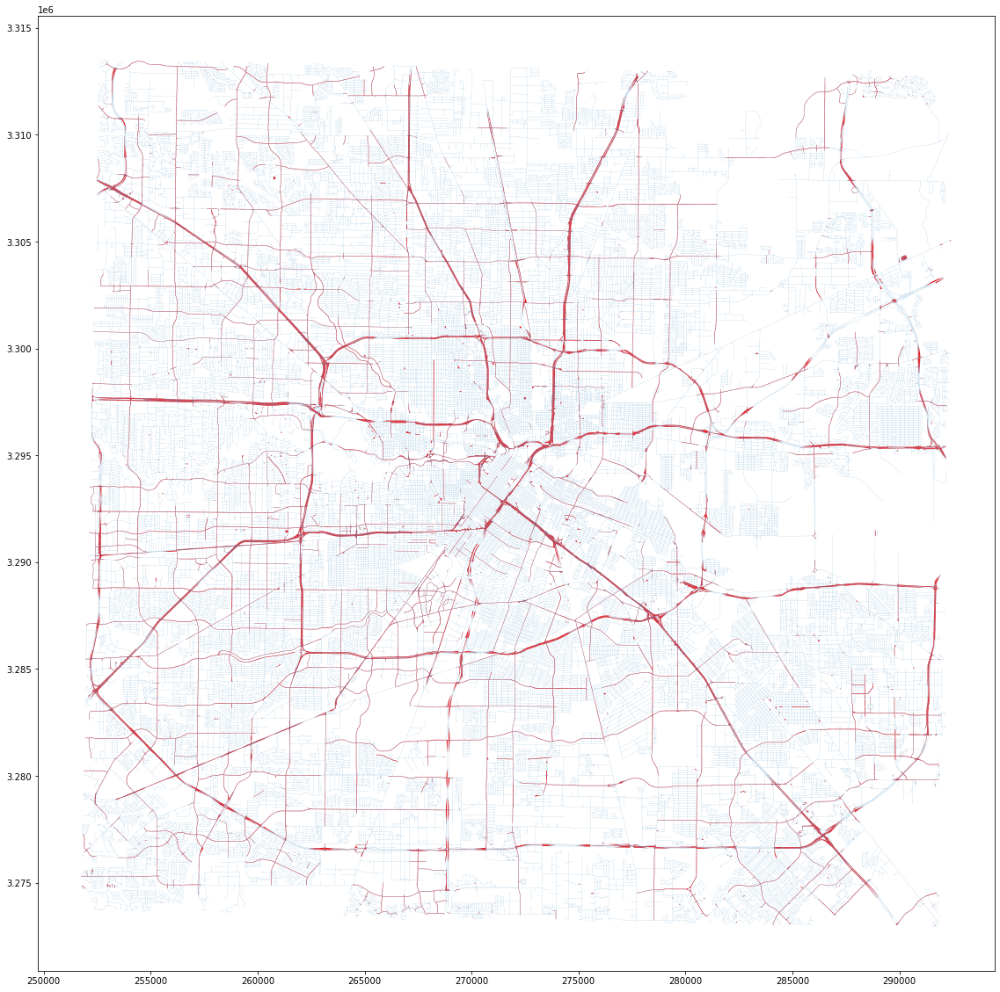

In [34]:
ax = polygons[db.labels_ == 1].plot(figsize=(20, 20),color='r')
network.plot(ax=ax, linewidth=.1)

### Derived

In [390]:
data = polygons[['area', 'circom']]

scaler = RobustScaler(with_centering=False)
scaled = scaler.fit_transform(data)

(-0.05, 2.0)

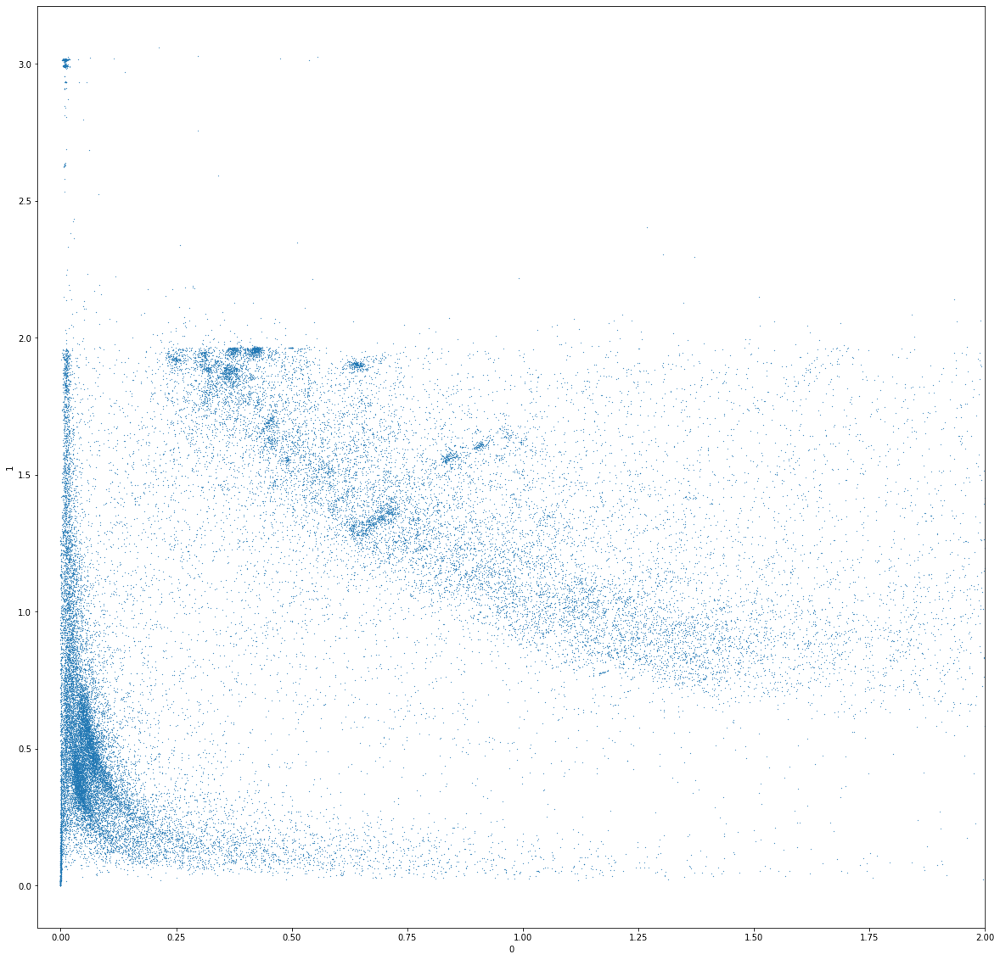

In [391]:
ax = pd.DataFrame(scaled).plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
ax.set_xlim(-.05, 2)

In [392]:
exp = 2
index = (scaled[:, 0] ** (1/exp)) * (scaled[:, 1] ** (1/exp))

In [388]:
from momepy.shape import _circle_area

index_directly = polygons.area / np.sqrt(polygons.convex_hull.exterior.apply(lambda hull: _circle_area(list(hull.coords))))

In [395]:
index

array([2.44379212, 1.57447791, 2.18469914, ..., 0.1061564 , 0.1544193 ,
       0.27222238])

<AxesSubplot:ylabel='Frequency'>

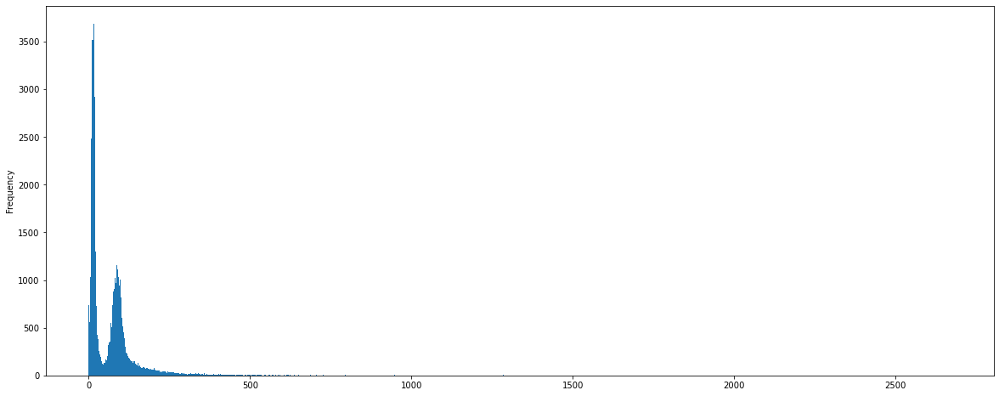

In [397]:
index_directly.plot.hist(figsize=(20, 8), bins=1000)

<AxesSubplot:ylabel='Frequency'>

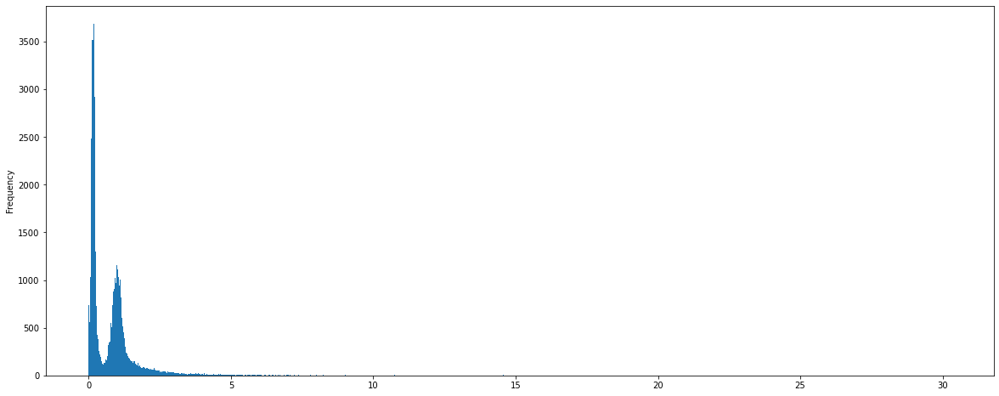

In [330]:
pd.Series(index).plot.hist(figsize=(20, 8), bins=1000)

In [265]:
# ax = polygons.plot(index, figsize=(20, 20),legend=True, scheme='quantiles', k=10)
# network.plot(ax=ax, linewidth=.1)

(-0.05, 2.0)

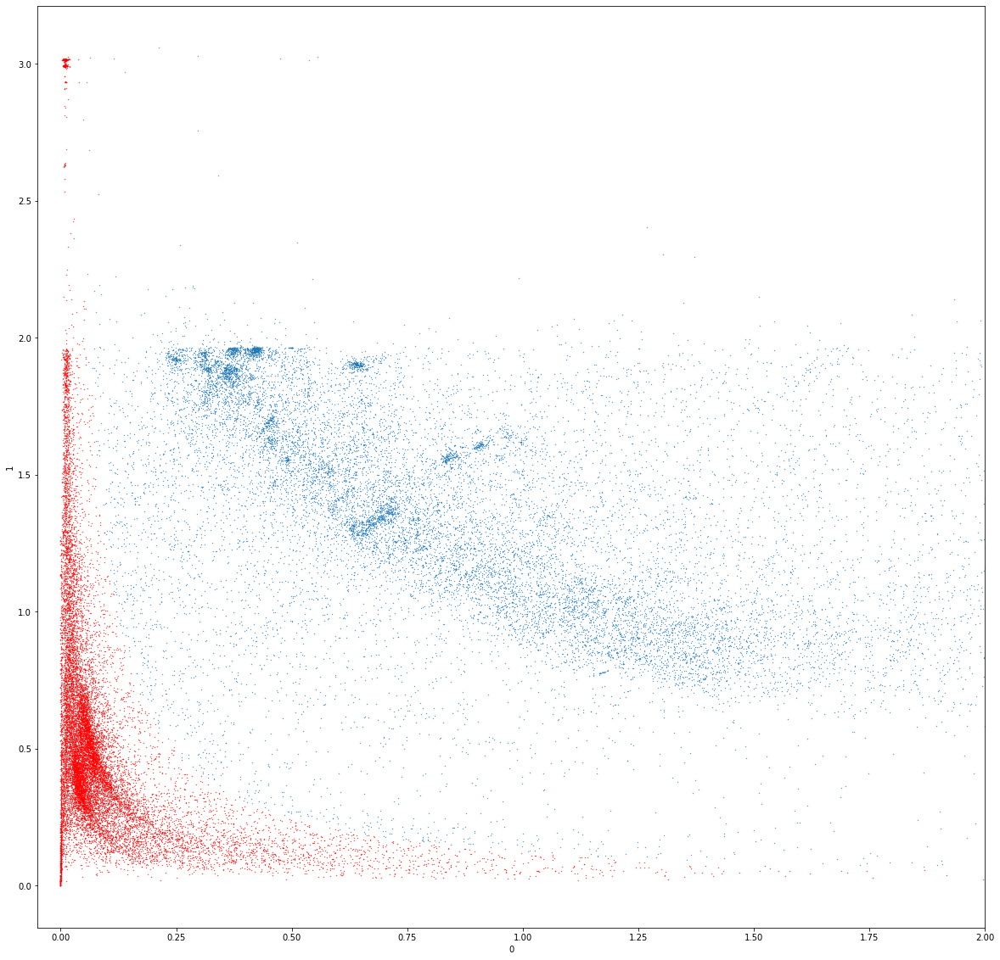

In [417]:
value = .35
ax = pd.DataFrame(scaled)[index > value].plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
pd.DataFrame(scaled)[index < value].plot.scatter(0, 1, ax=ax, c='r', s=.1)
ax.set_xlim(-.05, 2)

(-0.05, 2.0)

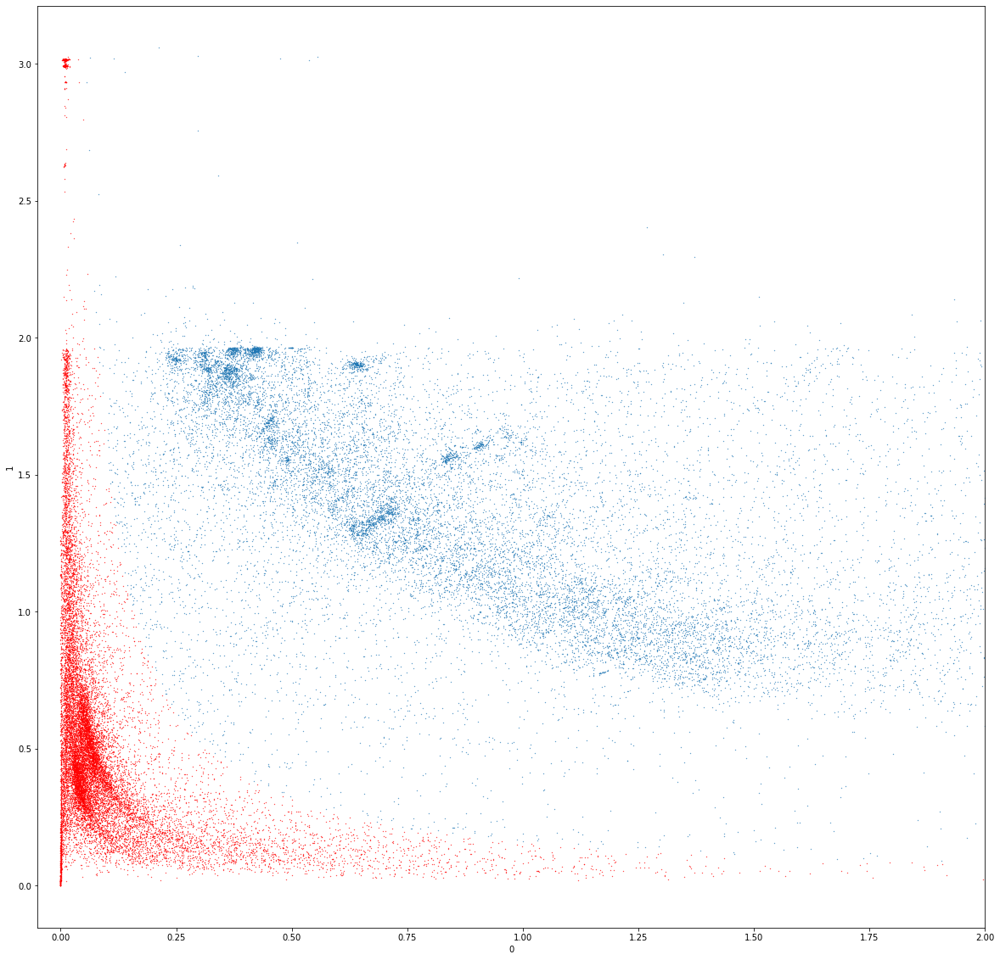

In [411]:
value = 35
ax = pd.DataFrame(scaled)[index_directly > value].plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
pd.DataFrame(scaled)[index_directly < value].plot.scatter(0, 1, ax=ax, c='r', s=.1)
ax.set_xlim(-.05, 2)

<AxesSubplot:>

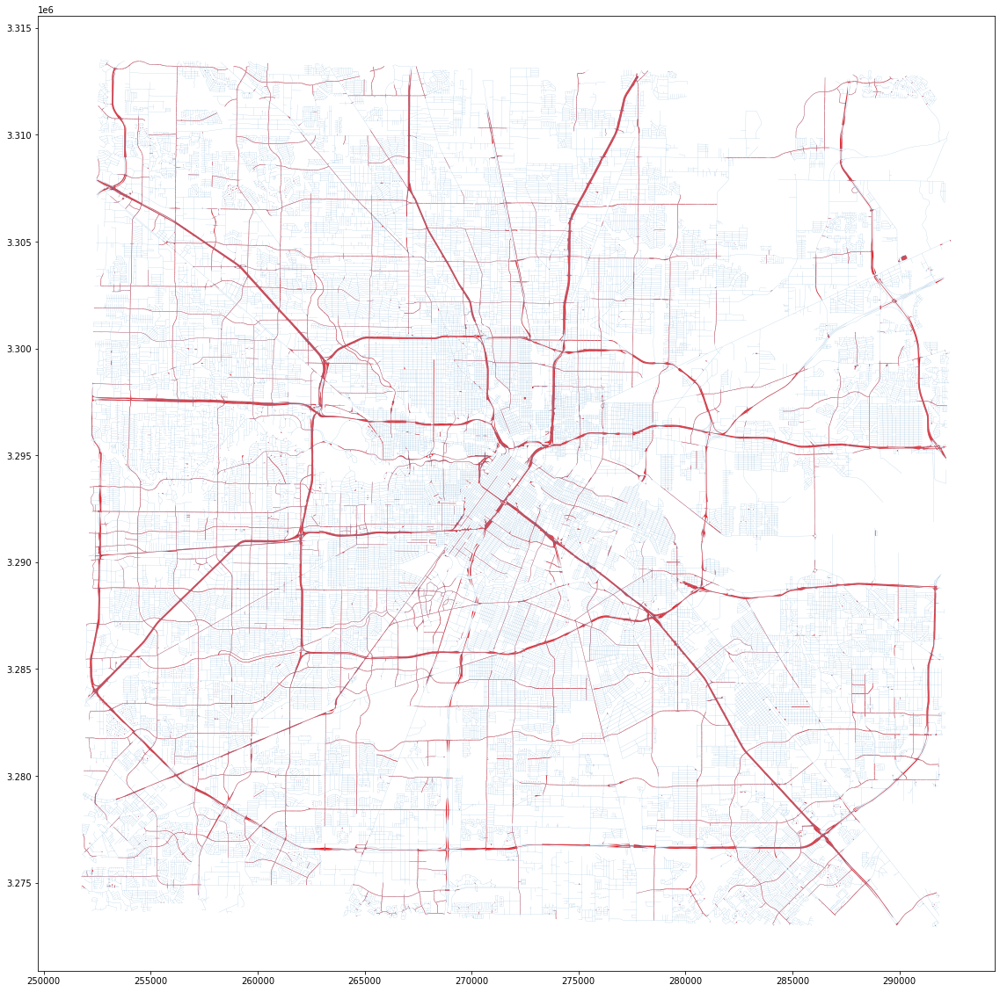

In [339]:
ax = polygons[index < value].plot(figsize=(20, 20),color='r')
network.plot(ax=ax, linewidth=.1)

## Barcelona

CPU times: user 32.4 s, sys: 209 ms, total: 32.6 s
Wall time: 36.5 s
CPU times: user 8.71 s, sys: 61.1 ms, total: 8.77 s
Wall time: 8.87 s
CPU times: user 9.76 s, sys: 47 ms, total: 9.81 s
Wall time: 9.92 s
CPU times: user 1.74 s, sys: 207 ms, total: 1.95 s
Wall time: 1.69 s


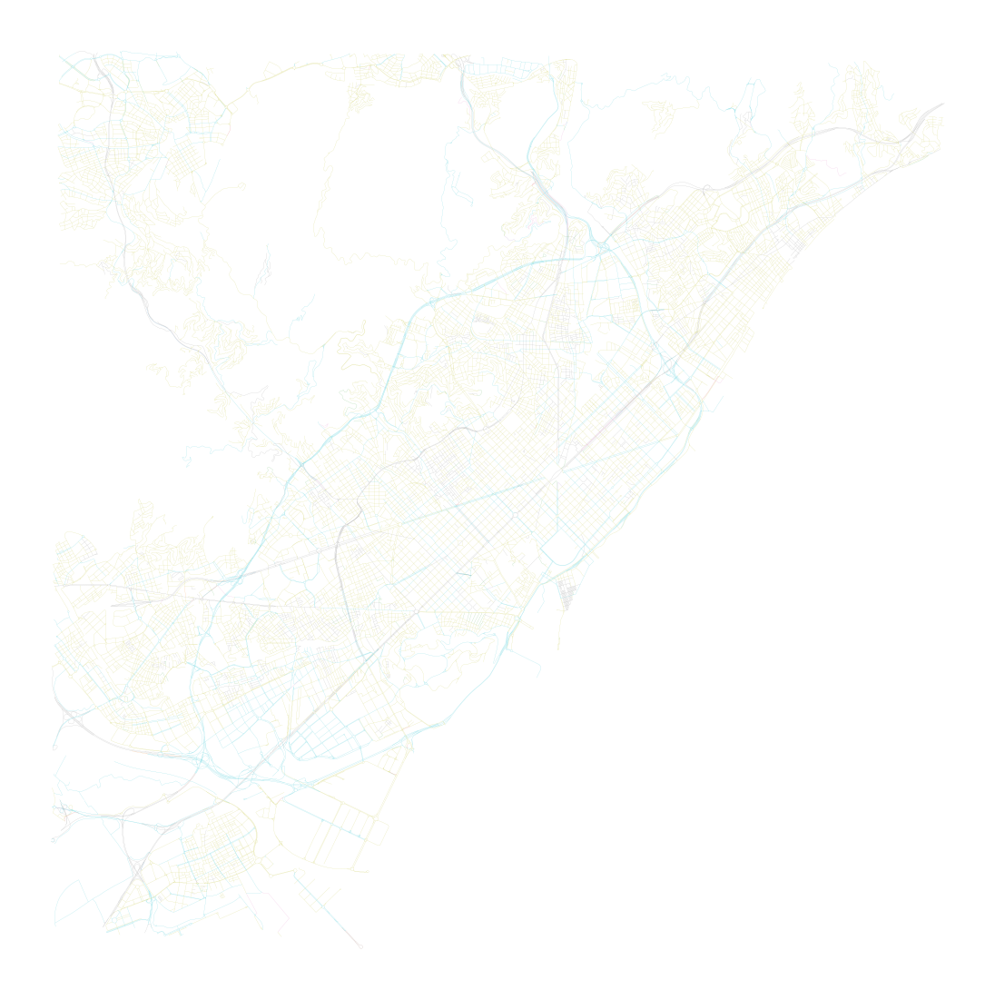

In [41]:
point = (41.39845, 2.17080)
dist = 10000

%time streets_graph = ox.graph_from_point(point, dist, network_type='drive')
%time streets_graph = ox.projection.project_graph(streets_graph)
%time gdf = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)
%time gdf.plot(gdf.highway.astype(str), figsize=(20, 20), linewidth=.1).set_axis_off()

In [42]:
%%time
network_bcn, midpoints_bcn = consolidate_nodes(gpd.GeoDataFrame(geometry=gdf.geometry), tolerance=30)

CPU times: user 3min 15s, sys: 248 ms, total: 3min 15s
Wall time: 3min 16s


In [340]:
%%time
polygonized = polygonize(network_bcn.geometry.unary_union)
polygons = gpd.GeoDataFrame(geometry=[g for g in polygonized], crs=network_bcn.crs)

CPU times: user 2.25 s, sys: 23.1 ms, total: 2.27 s
Wall time: 2.3 s


In [341]:
%time polygons['area'] = polygons.area
%time polygons['circom'] = mm.CircularCompactness(polygons, 'area').series

CPU times: user 9.47 ms, sys: 2.01 ms, total: 11.5 ms
Wall time: 9.04 ms
CPU times: user 1.75 s, sys: 15 ms, total: 1.76 s
Wall time: 1.78 s


(-100.0, 20000.0)

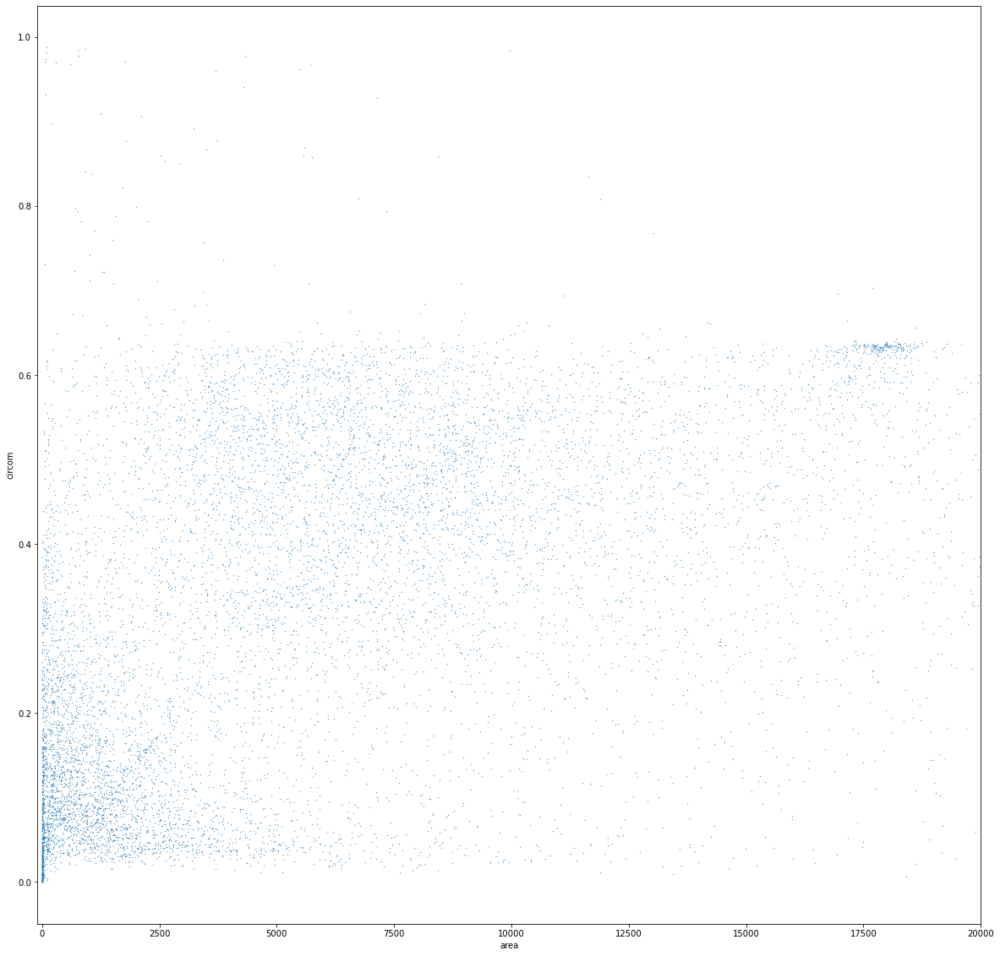

In [56]:
ax = polygons[['circom', 'area']].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

In [50]:
data = polygons[['area', 'circom']]

scaler = RobustScaler()
scaled = scaler.fit_transform(data)

In [58]:
db = DBSCAN(eps=.03, min_samples=10).fit(scaled)
np.unique(db.labels_, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
        16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
        33, 34, 35, 36, 37, 38, 39, 40, 41]),
 array([3561, 4042, 3882,   29,   22,   10,  319,   17,   43,   22,   24,
          15,   32,   16,   15,   34,   40,   18,   11,    9,   32,   13,
           8,   33,   15,   22,    7,   10,   12,   18,   11,   10,   10,
          19,   11,    9,   10,   10,   19,    8,    5,    4,    7]))

(-100.0, 20000.0)

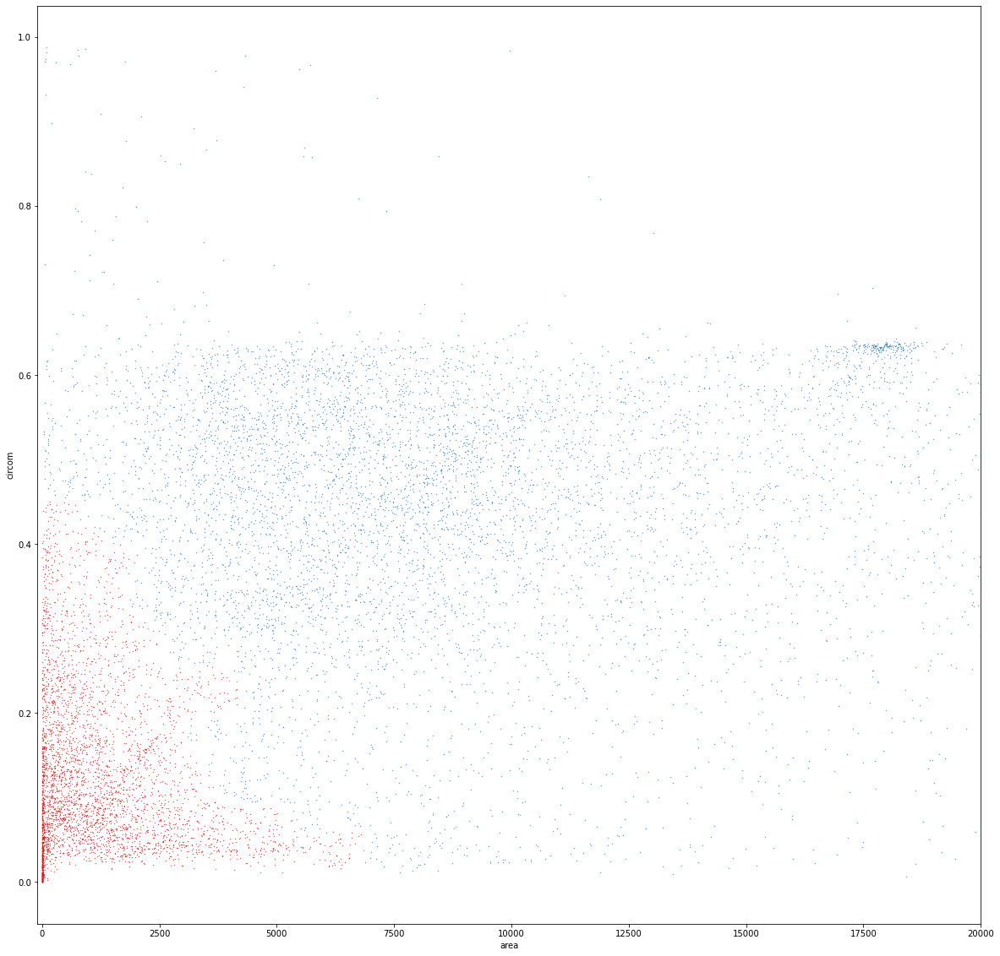

In [59]:
ax = polygons[['circom', 'area']][db.labels_ != 0].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
polygons[['circom', 'area']][db.labels_ == 0].plot.scatter('area', 'circom', ax=ax, color='r', s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

<AxesSubplot:>

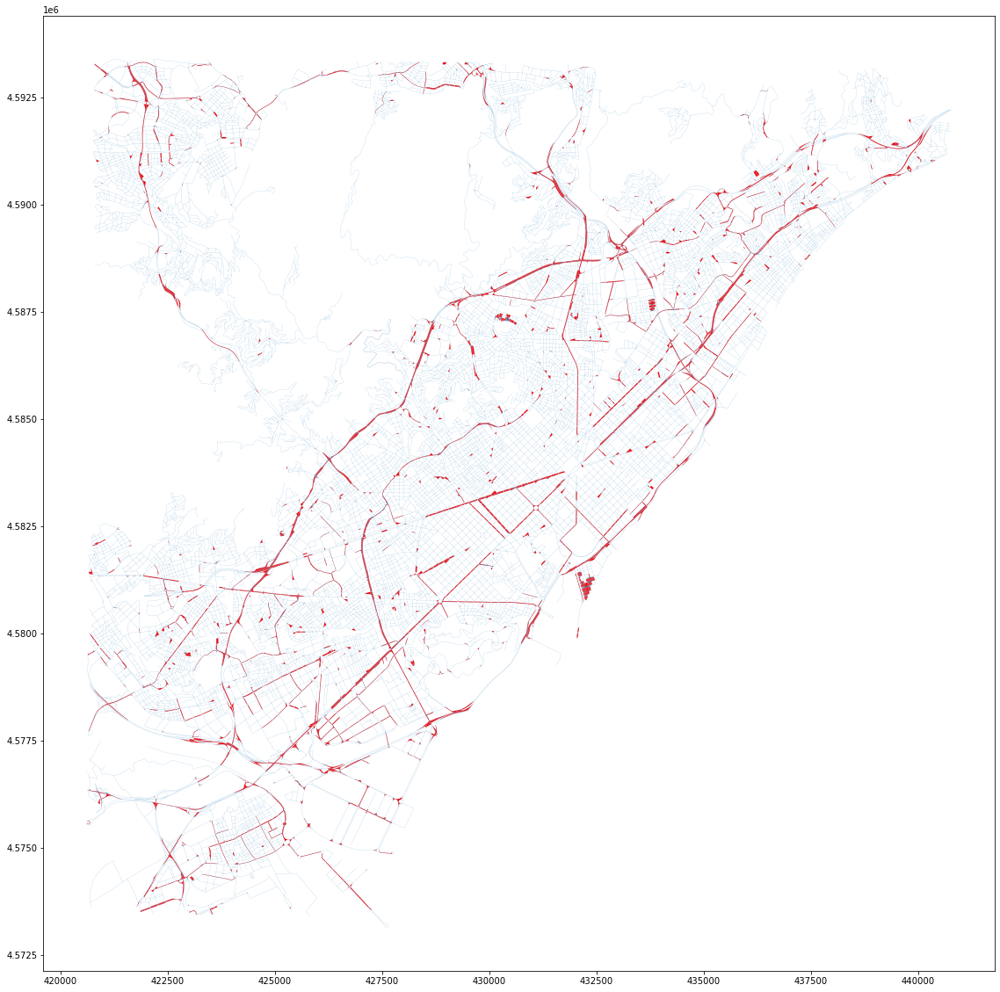

In [60]:
ax = polygons[db.labels_ == 0].plot(figsize=(20, 20),color='r')
network_bcn.plot(ax=ax, linewidth=.1)

### Derived

In [342]:
data = polygons[['area', 'circom']]

scaler = RobustScaler(with_centering=False)
scaled = scaler.fit_transform(data)

(-0.05, 2.0)

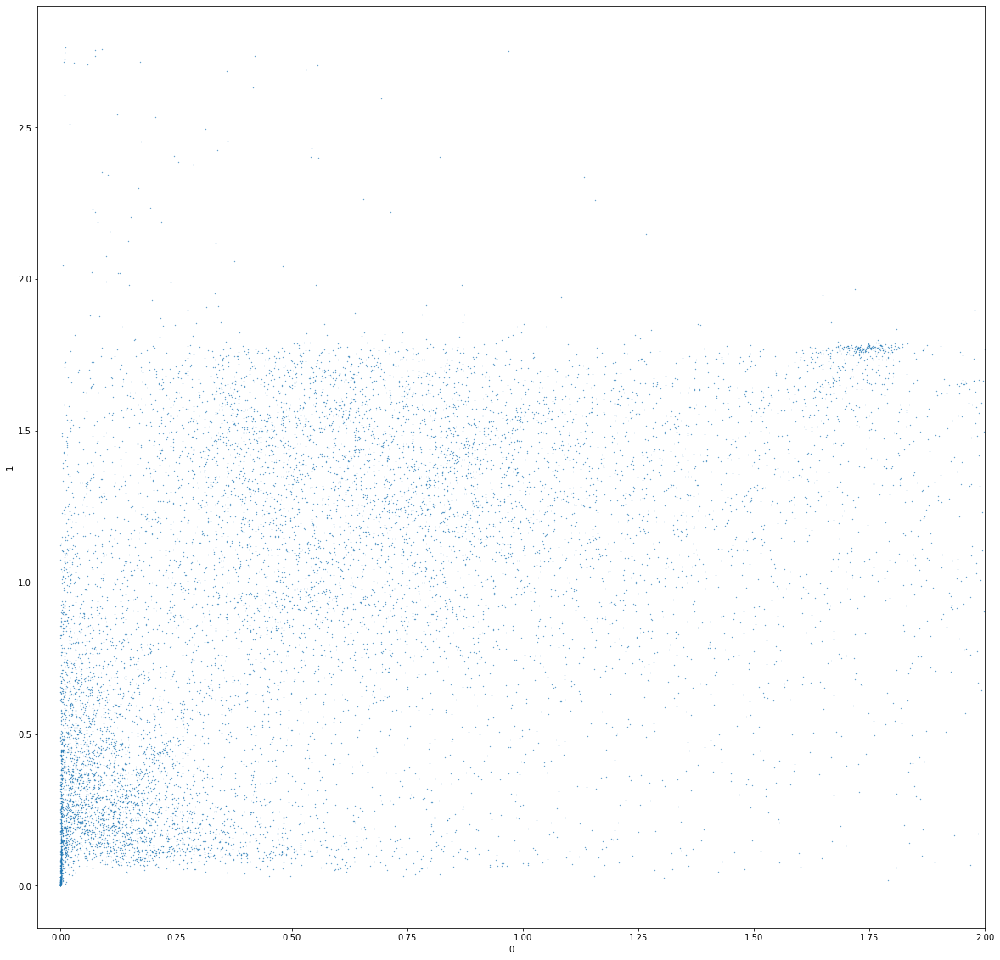

In [343]:
ax = pd.DataFrame(scaled).plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
ax.set_xlim(-.05, 2)

In [344]:
exp = 2
index = (scaled[:, 0] ** (1/exp)) * (scaled[:, 1] ** (1/exp))

<AxesSubplot:ylabel='Frequency'>

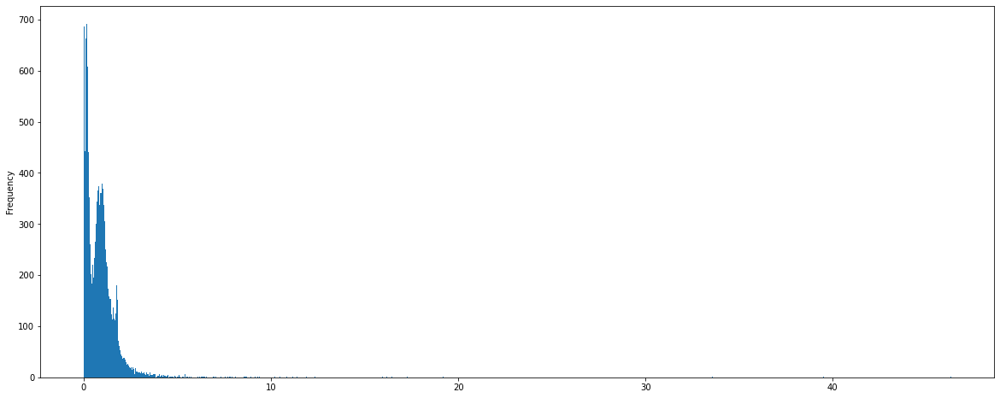

In [345]:
pd.Series(index).plot.hist(figsize=(20, 8), bins=1000)

(-0.05, 2.0)

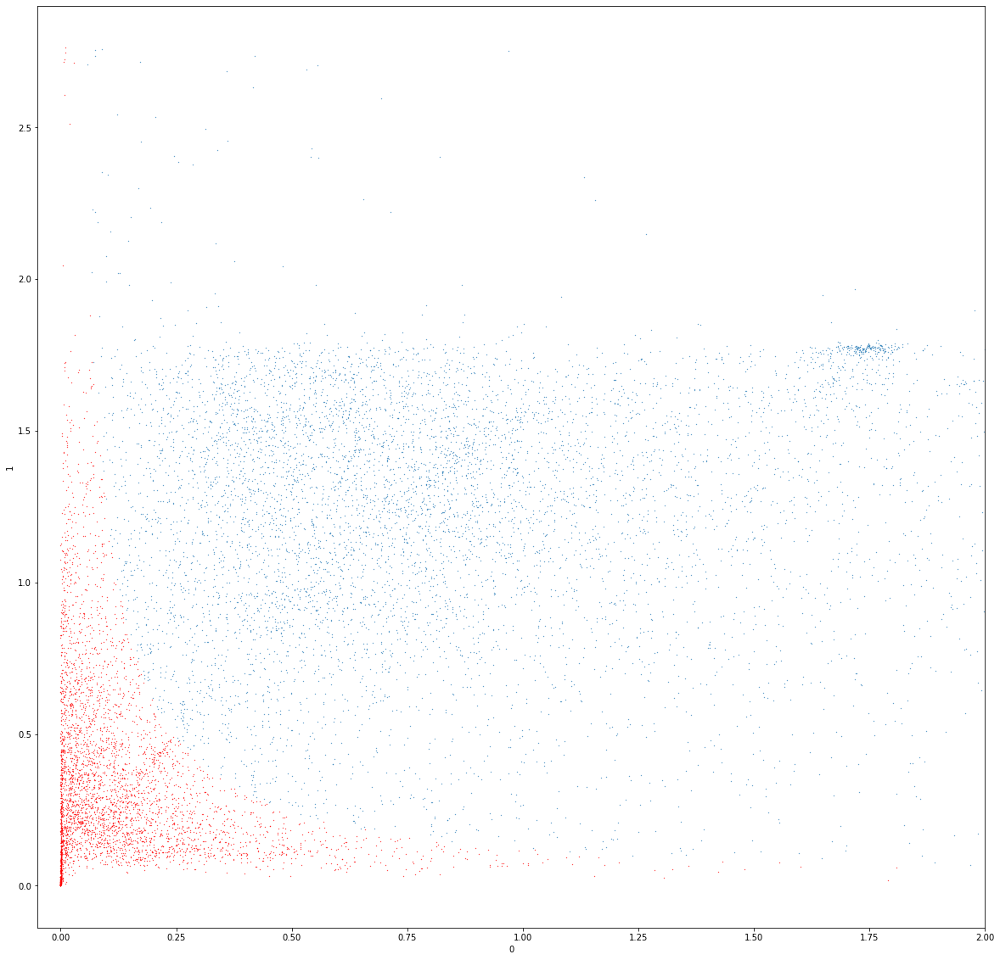

In [350]:
value = .35
ax = pd.DataFrame(scaled)[index > value].plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
pd.DataFrame(scaled)[index < value].plot.scatter(0, 1, ax=ax, c='r', s=.1)
ax.set_xlim(-.05, 2)

<AxesSubplot:>

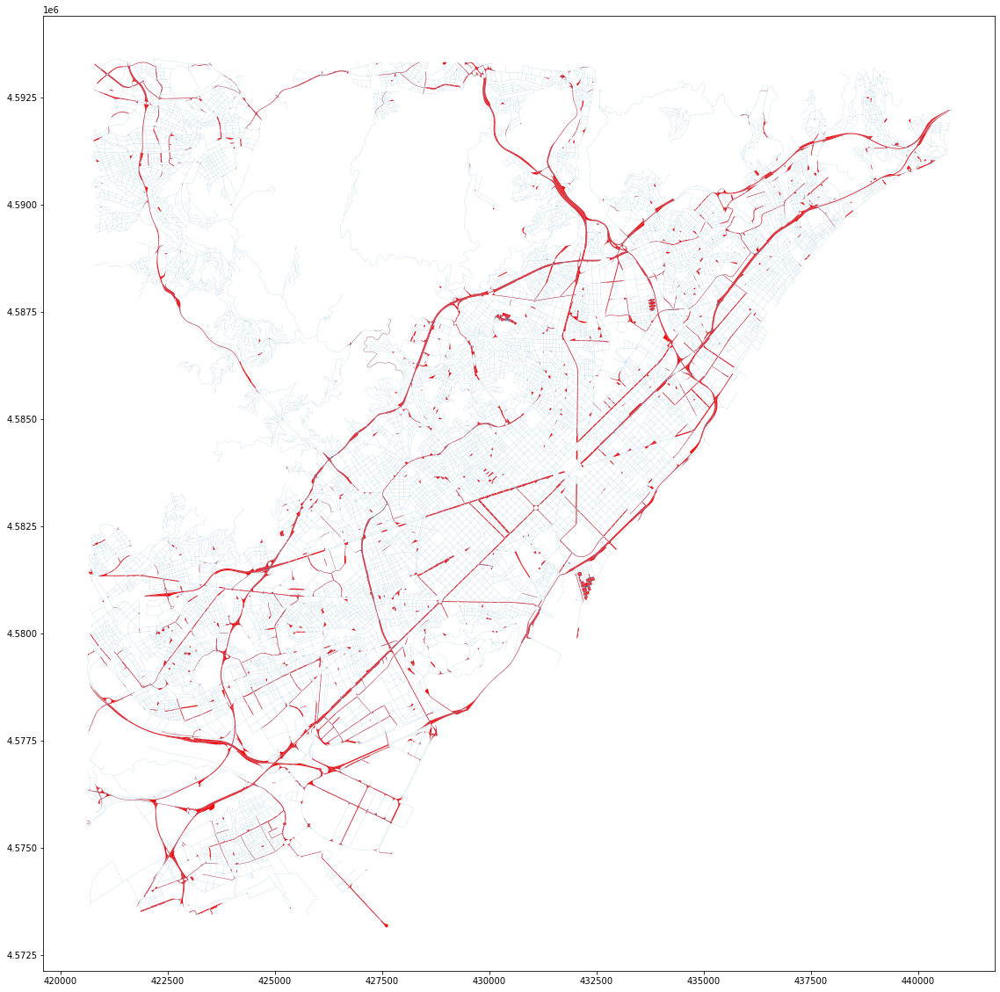

In [349]:
ax = polygons[index < value].plot(figsize=(20, 20),color='r')
network_bcn.plot(ax=ax, linewidth=.1)

## Hong Kong

CPU times: user 20.4 s, sys: 169 ms, total: 20.6 s
Wall time: 26.6 s
CPU times: user 4.59 s, sys: 10 ms, total: 4.6 s
Wall time: 4.63 s
CPU times: user 4.72 s, sys: 10.9 ms, total: 4.73 s
Wall time: 4.71 s
CPU times: user 1.1 s, sys: 195 ms, total: 1.29 s
Wall time: 1.03 s


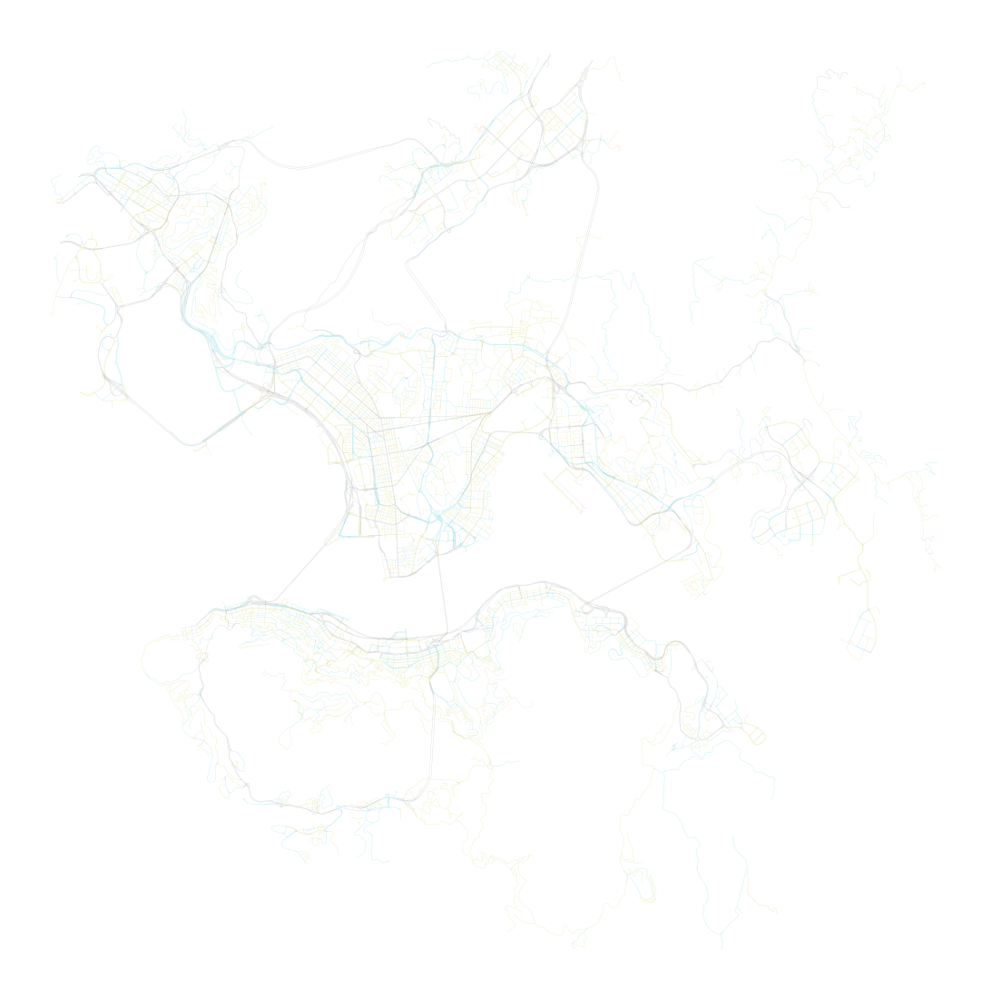

In [62]:
point = (22.31060, 114.19270)
dist = 10000

%time streets_graph = ox.graph_from_point(point, dist, network_type='drive')
%time streets_graph = ox.projection.project_graph(streets_graph)
%time gdf = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)
%time gdf.plot(gdf.highway.astype(str), figsize=(20, 20), linewidth=.1).set_axis_off()

In [63]:
%%time
network_hk, midpoints_hk = consolidate_nodes(gpd.GeoDataFrame(geometry=gdf.geometry), tolerance=30)

CPU times: user 1min 15s, sys: 203 ms, total: 1min 16s
Wall time: 1min 16s


In [351]:
%%time
polygonized = polygonize(network_hk.geometry.unary_union)
polygons = gpd.GeoDataFrame(geometry=[g for g in polygonized], crs=network_hk.crs)

CPU times: user 1.24 s, sys: 23 ms, total: 1.26 s
Wall time: 1.3 s


In [352]:
%time polygons['area'] = polygons.area
%time polygons['circom'] = mm.CircularCompactness(polygons, 'area').series

CPU times: user 6.92 ms, sys: 2.01 ms, total: 8.93 ms
Wall time: 6.75 ms
CPU times: user 1.06 s, sys: 11 ms, total: 1.08 s
Wall time: 1.06 s


(-100.0, 20000.0)

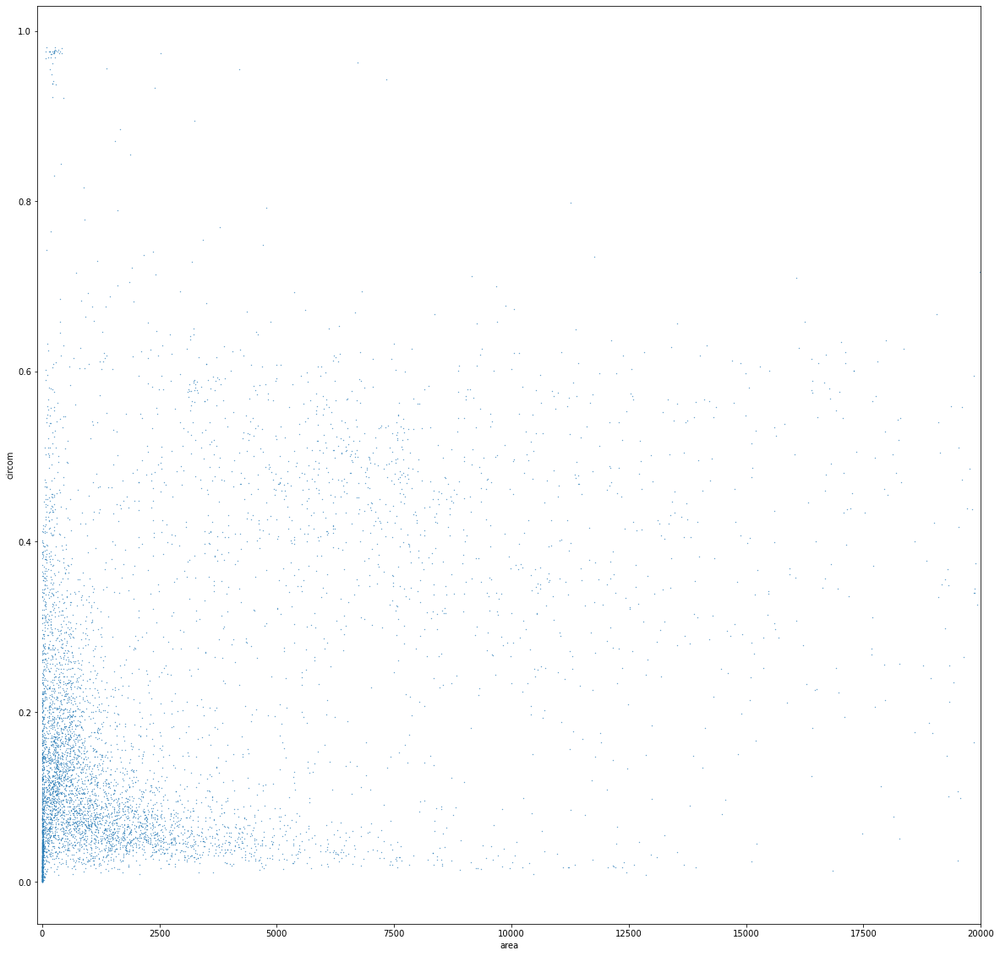

In [75]:
ax = polygons[['circom', 'area']].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

In [76]:
data = polygons[['area', 'circom']]

scaler = RobustScaler()
scaled = scaler.fit_transform(data)

In [81]:
db = DBSCAN(eps=.08, min_samples=10).fit(scaled)
np.unique(db.labels_, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 array([1506,  606, 4884,   15,   13,   22,   10,   12,   13,   10,   34,
           8,   10,   10]))

(-100.0, 20000.0)

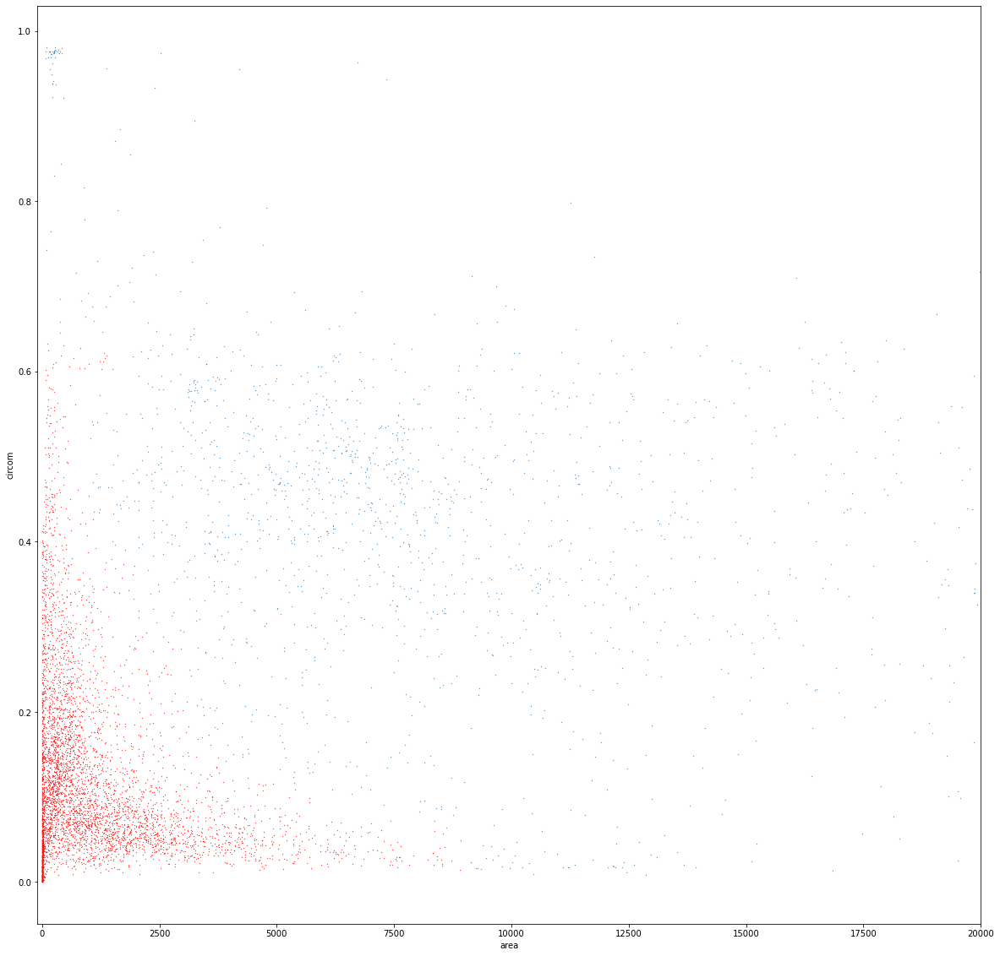

In [83]:
ax = polygons[['circom', 'area']][db.labels_ != 1].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
polygons[['circom', 'area']][db.labels_ == 1].plot.scatter('area', 'circom', ax=ax, color='r', s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

<AxesSubplot:>

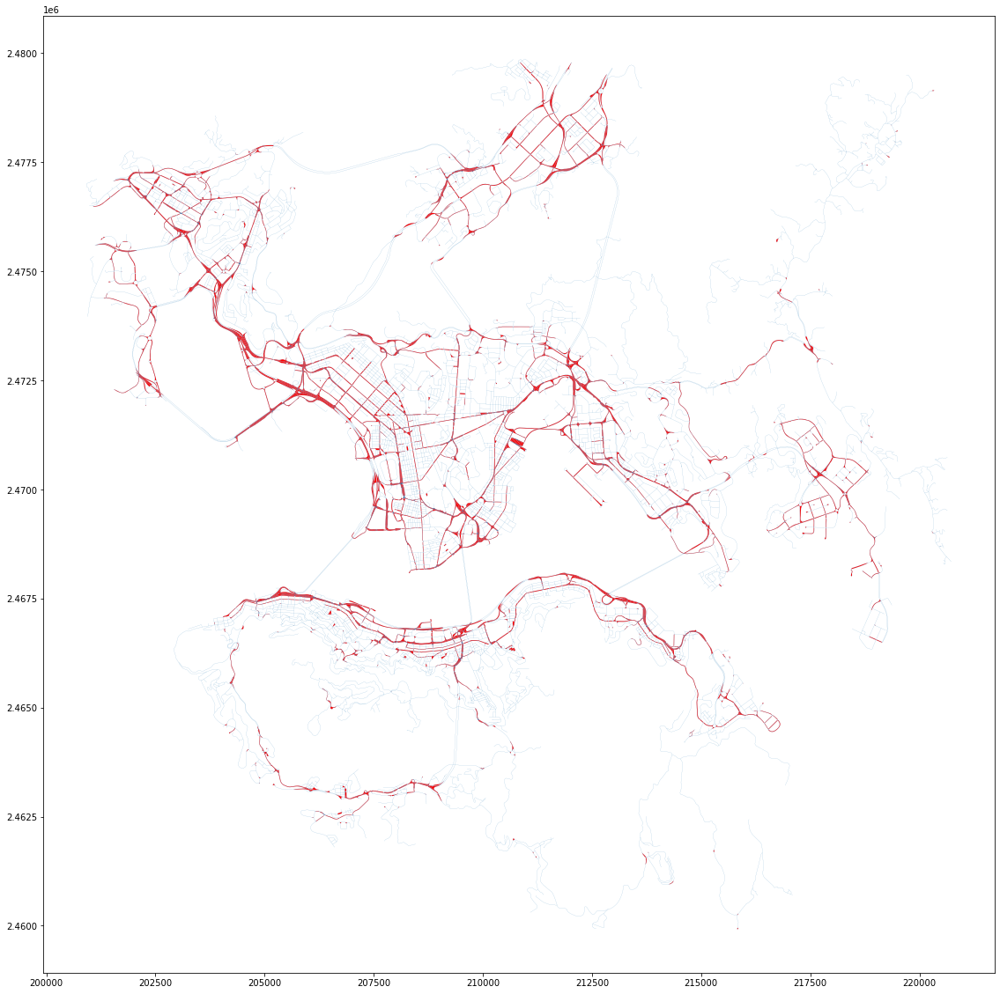

In [85]:
ax = polygons[db.labels_ == 1].plot(figsize=(20, 20),color='r')
network_hk.plot(ax=ax, linewidth=.1)

### Derived

<AxesSubplot:ylabel='Frequency'>

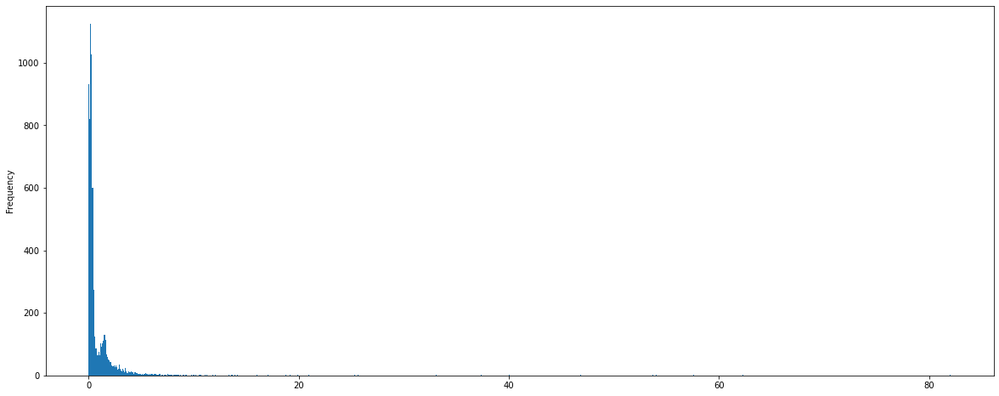

In [353]:
data = polygons[['area', 'circom']]

scaler = RobustScaler(with_centering=False)
scaled = scaler.fit_transform(data)

exp = 2

index = (scaled[:, 0] ** (1/exp)) * (scaled[:, 1] ** (1/exp))
pd.Series(index).plot.hist(figsize=(20, 8), bins=1000)

(-0.05, 2.0)

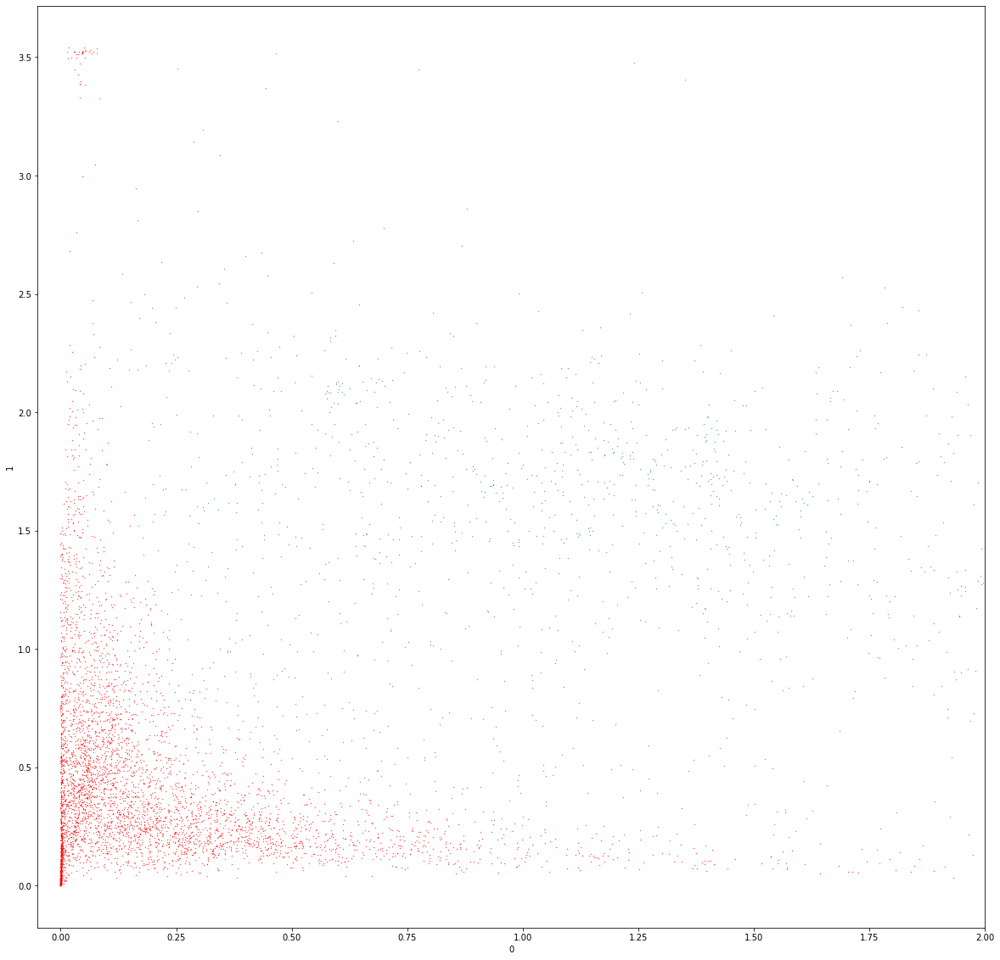

In [357]:
value = .5
ax = pd.DataFrame(scaled)[index > value].plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
pd.DataFrame(scaled)[index < value].plot.scatter(0, 1, ax=ax, c='r', s=.1)
ax.set_xlim(-.05, 2)

<AxesSubplot:>

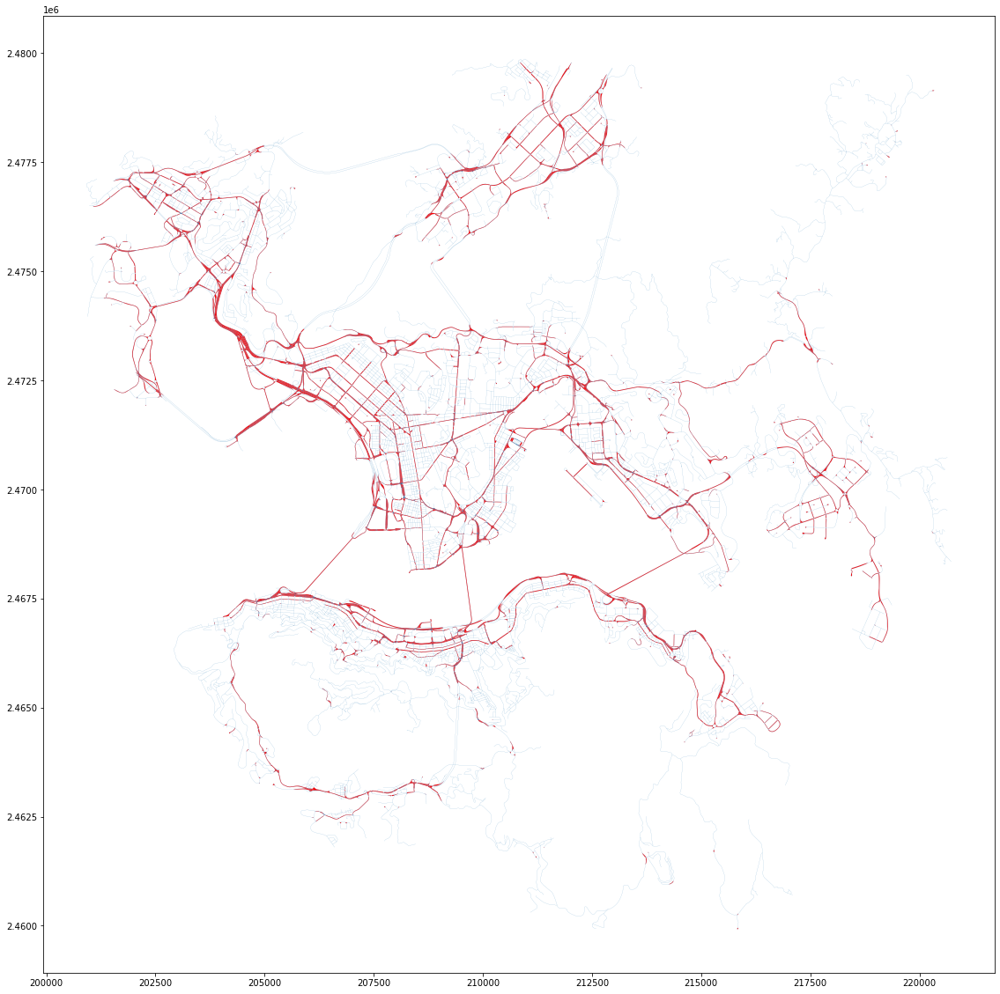

In [358]:
ax = polygons[index < value].plot(figsize=(20, 20),color='r')
network_hk.plot(ax=ax, linewidth=.1)

## Dar es Salaam

CPU times: user 1min 43s, sys: 2.23 s, total: 1min 45s
Wall time: 1min 54s
CPU times: user 26.7 s, sys: 64.8 ms, total: 26.8 s
Wall time: 26.9 s
CPU times: user 1min 13s, sys: 178 ms, total: 1min 14s
Wall time: 1min 14s
CPU times: user 4.21 s, sys: 207 ms, total: 4.42 s
Wall time: 4.13 s


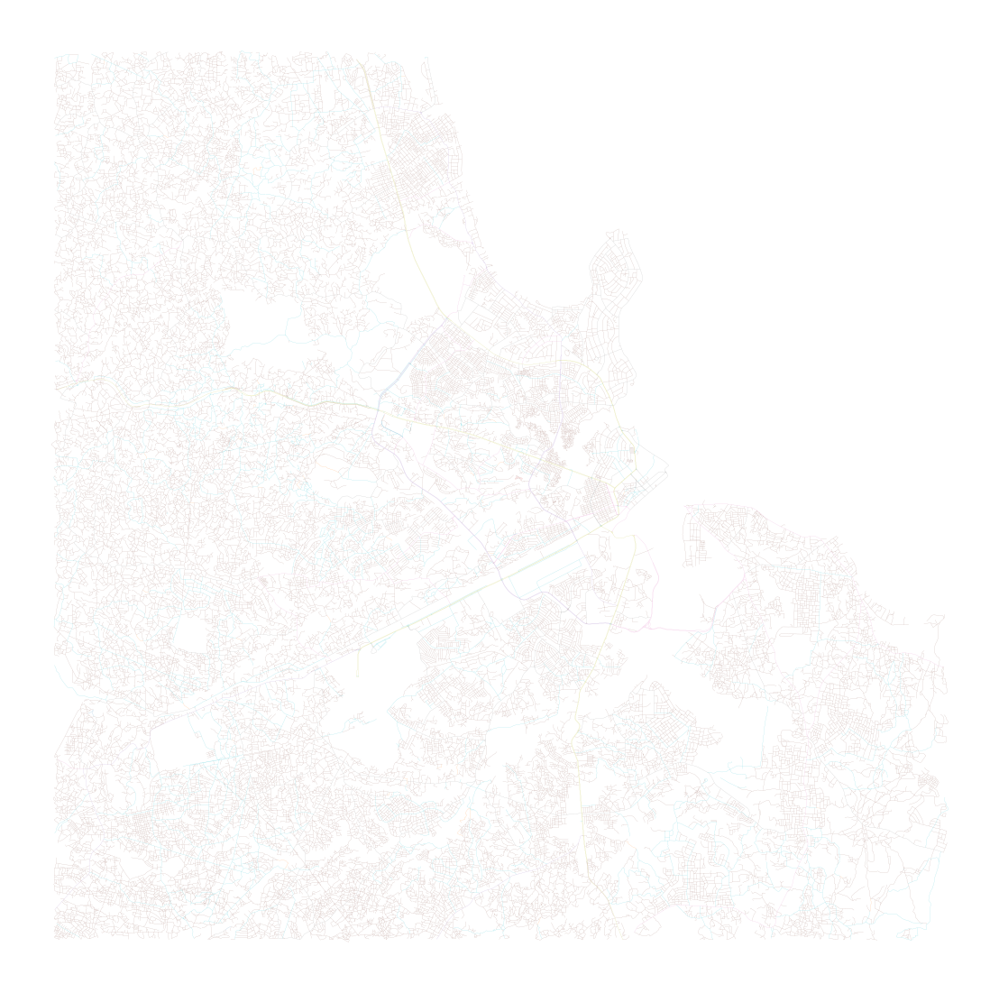

In [86]:
point = (-6.81845, 39.24568)
dist = 15000

%time streets_graph = ox.graph_from_point(point, dist, network_type='drive')
%time streets_graph = ox.projection.project_graph(streets_graph)
%time gdf = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)
%time gdf.plot(gdf.highway.astype(str), figsize=(20, 20), linewidth=.1).set_axis_off()

In [87]:
%%time
network_ds, midpoints_ds = consolidate_nodes(gpd.GeoDataFrame(geometry=gdf.geometry), tolerance=30)

CPU times: user 13min 54s, sys: 1.37 s, total: 13min 55s
Wall time: 13min 57s


In [360]:
%%time
polygonized = polygonize(network_ds.geometry.unary_union)
polygons = gpd.GeoDataFrame(geometry=[g for g in polygonized], crs=network_ds.crs)

CPU times: user 6.32 s, sys: 33.9 ms, total: 6.36 s
Wall time: 6.4 s


In [361]:
%time polygons['area'] = polygons.area
%time polygons['circom'] = mm.CircularCompactness(polygons, 'area').series

CPU times: user 15.7 ms, sys: 4 ms, total: 19.7 ms
Wall time: 17.2 ms
CPU times: user 3.42 s, sys: 25 ms, total: 3.44 s
Wall time: 3.48 s


(-100.0, 20000.0)

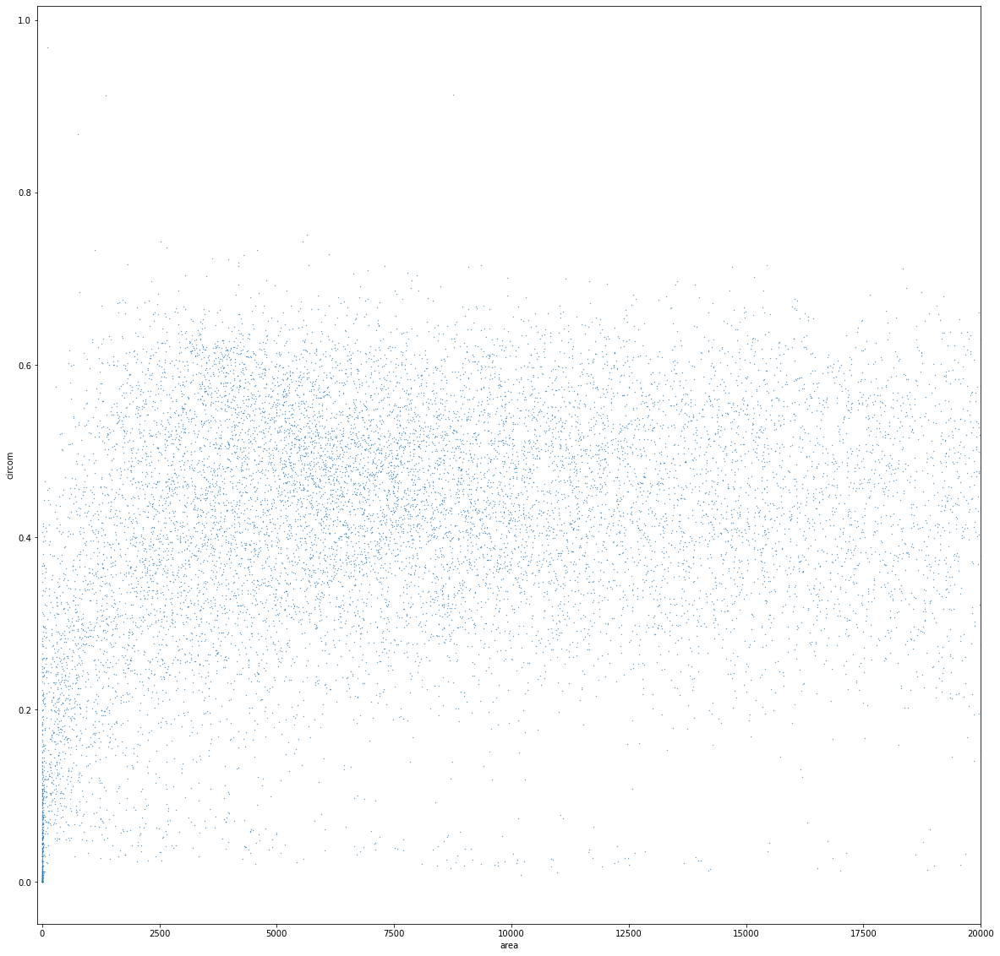

In [94]:
ax = polygons[['circom', 'area']].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

In [95]:
data = polygons[['area', 'circom']]

scaler = RobustScaler()
scaled = scaler.fit_transform(data)

In [111]:
db = DBSCAN(eps=.02, min_samples=10).fit(scaled)
u, c = np.unique(db.labels_, return_counts=True)
u[c==457]

array([66])

(-100.0, 20000.0)

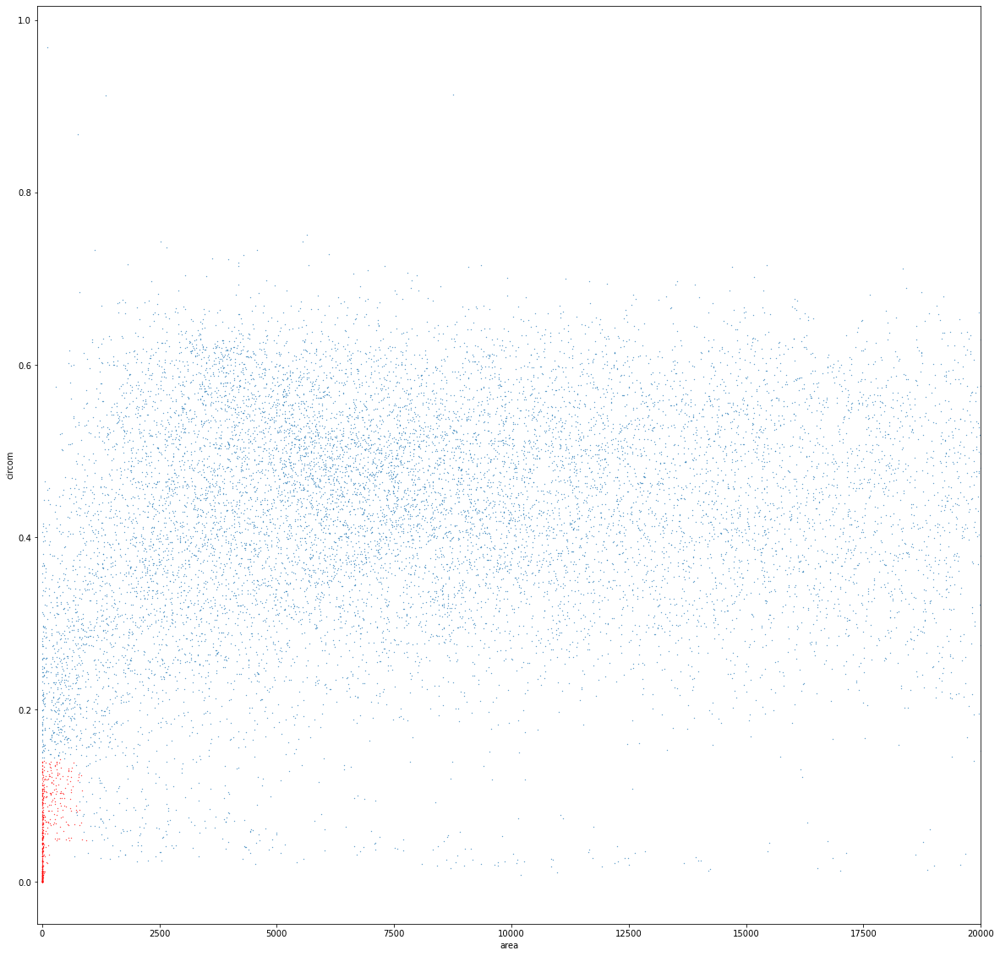

In [112]:
l = 66
ax = polygons[['circom', 'area']][db.labels_ != l].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
polygons[['circom', 'area']][db.labels_ == l].plot.scatter('area', 'circom', ax=ax, color='r', s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

<AxesSubplot:>

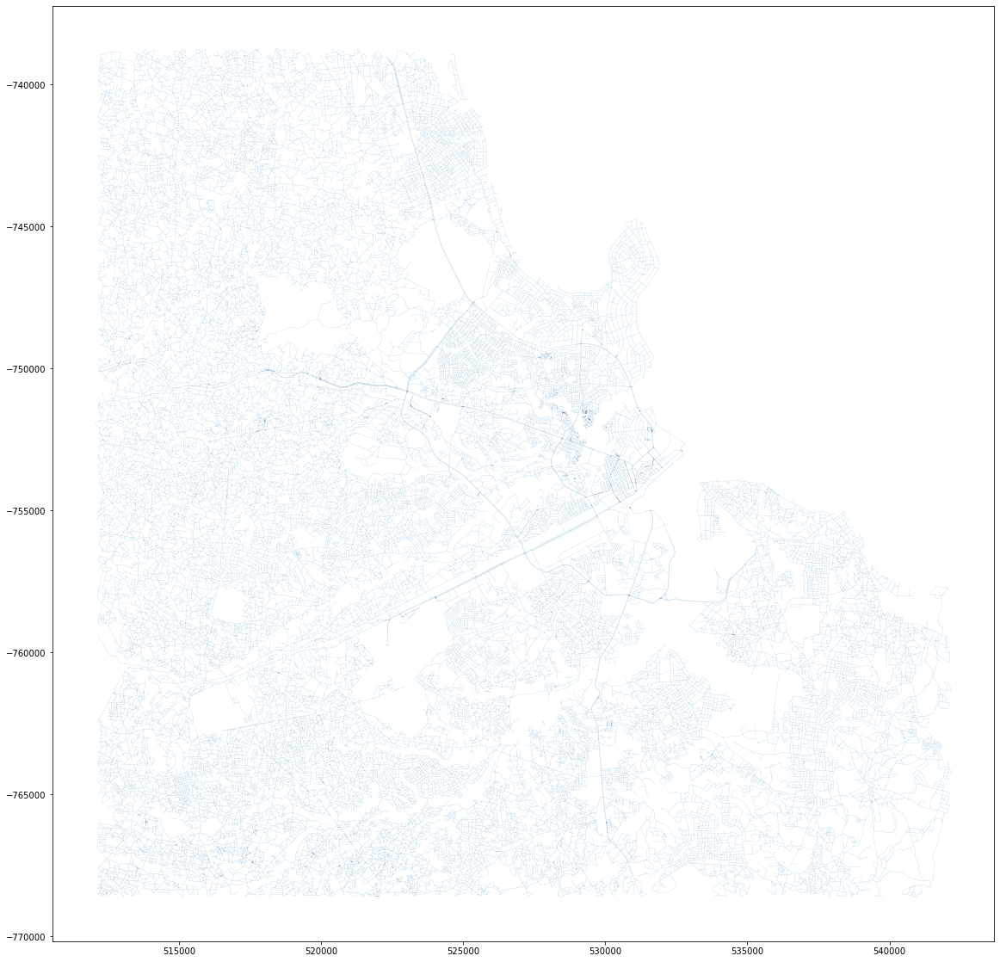

In [113]:
ax = polygons[db.labels_ == 66].plot(figsize=(20, 20),color='r')
network_ds.plot(ax=ax, linewidth=.1)

### Derived

<AxesSubplot:ylabel='Frequency'>

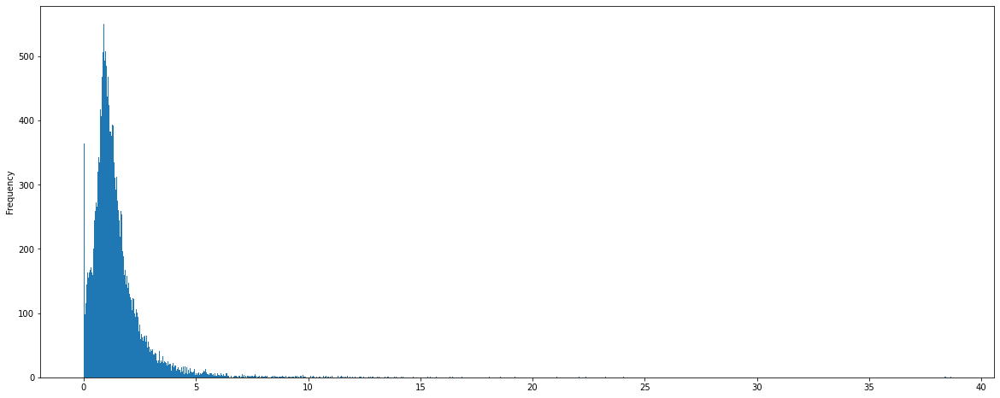

In [362]:
data = polygons[['area', 'circom']]

scaler = RobustScaler(with_centering=False)
scaled = scaler.fit_transform(data)

exp = 2

index = (scaled[:, 0] ** (1/exp)) * (scaled[:, 1] ** (1/exp))
pd.Series(index).plot.hist(figsize=(20, 8), bins=1000)

(-0.05, 2.0)

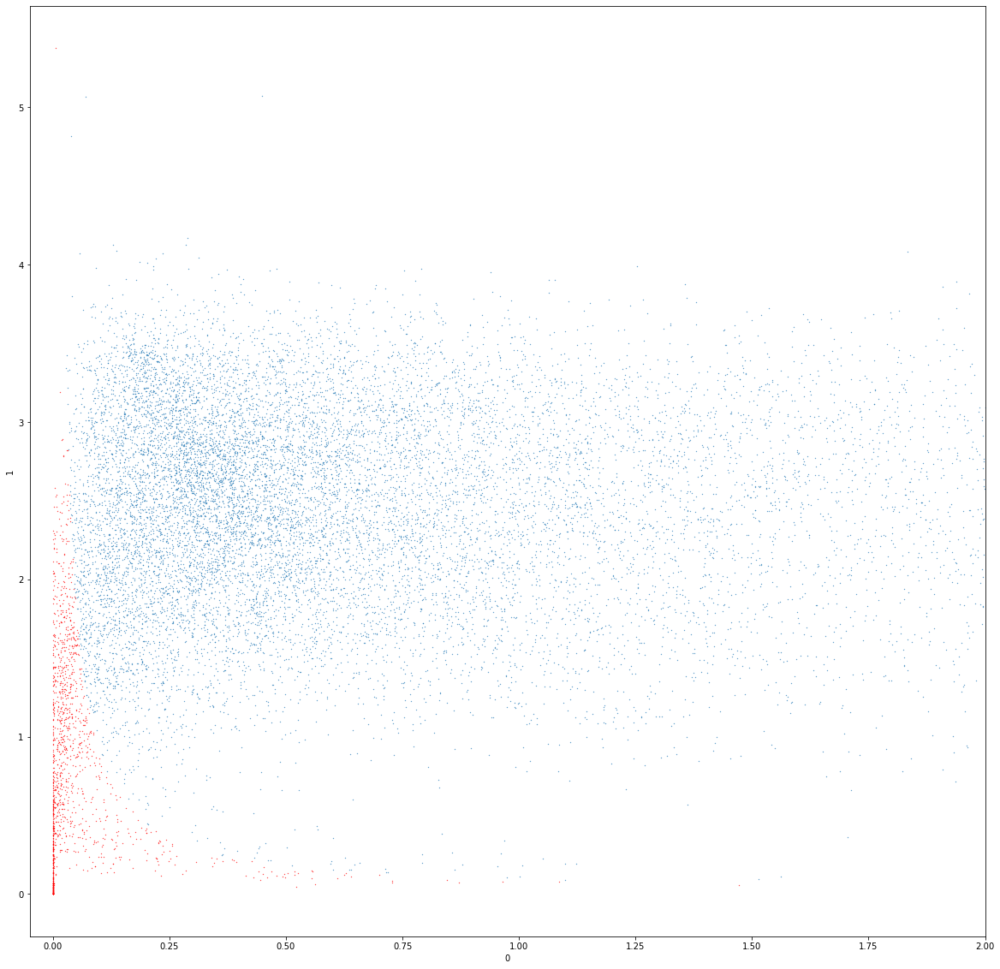

In [367]:
value = .3
ax = pd.DataFrame(scaled)[index > value].plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
pd.DataFrame(scaled)[index < value].plot.scatter(0, 1, ax=ax, c='r', s=.1)
ax.set_xlim(-.05, 2)

<AxesSubplot:>

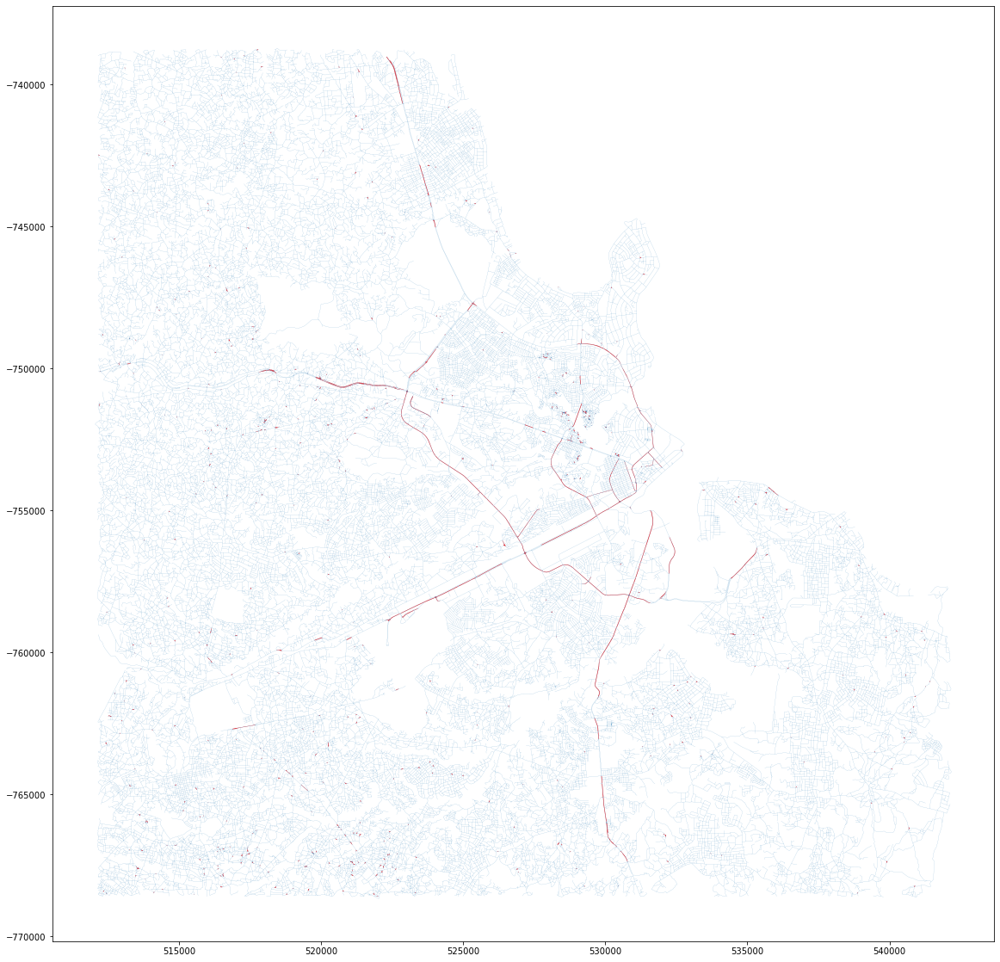

In [368]:
ax = polygons[index < value].plot(figsize=(20, 20),color='r')
network_ds.plot(ax=ax, linewidth=.1)

## Manhattan

CPU times: user 9.51 s, sys: 141 ms, total: 9.65 s
Wall time: 22.2 s
CPU times: user 2.19 s, sys: 15 ms, total: 2.21 s
Wall time: 2.22 s
CPU times: user 1.91 s, sys: 8.72 ms, total: 1.92 s
Wall time: 1.95 s
CPU times: user 597 ms, sys: 128 ms, total: 725 ms
Wall time: 547 ms


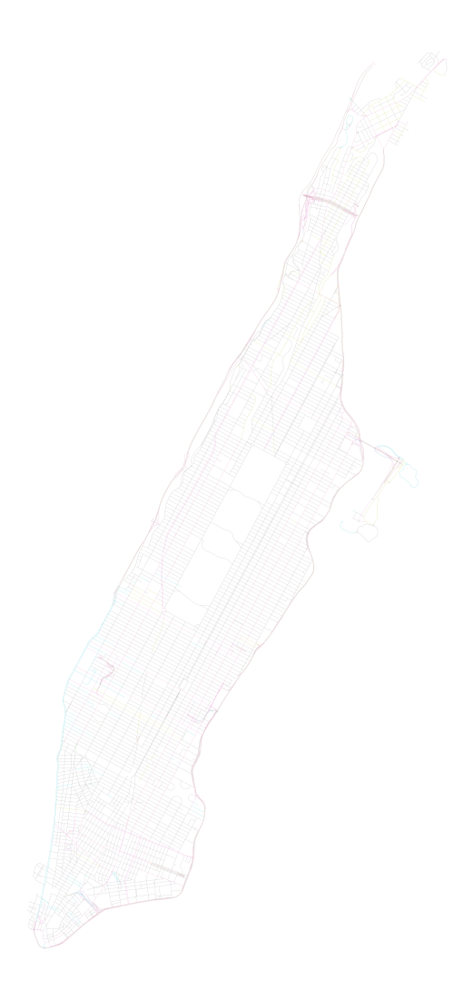

In [114]:
point = (-6.81845, 39.24568)
dist = 15000

%time streets_graph = ox.graph_from_place("manhattan", network_type='drive')
%time streets_graph = ox.projection.project_graph(streets_graph)
%time gdf = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)
%time gdf.plot(gdf.highway.astype(str), figsize=(20, 20), linewidth=.1).set_axis_off()

In [115]:
%%time
network_ny, midpoints_ny = consolidate_nodes(gpd.GeoDataFrame(geometry=gdf.geometry), tolerance=30)

CPU times: user 18.8 s, sys: 41.8 ms, total: 18.8 s
Wall time: 18.9 s


In [418]:
%%time
polygonized = polygonize(network_ny.geometry.unary_union)
polygons = gpd.GeoDataFrame(geometry=[g for g in polygonized], crs=network_ny.crs)

CPU times: user 2.77 s, sys: 8.92 ms, total: 2.77 s
Wall time: 2.78 s


In [419]:
%time polygons['area'] = polygons.area
%time polygons['circom'] = mm.CircularCompactness(polygons, 'area').series

CPU times: user 4.76 ms, sys: 4 ms, total: 8.76 ms
Wall time: 6.72 ms
CPU times: user 518 ms, sys: 1.02 ms, total: 519 ms
Wall time: 518 ms


(-100.0, 50000.0)

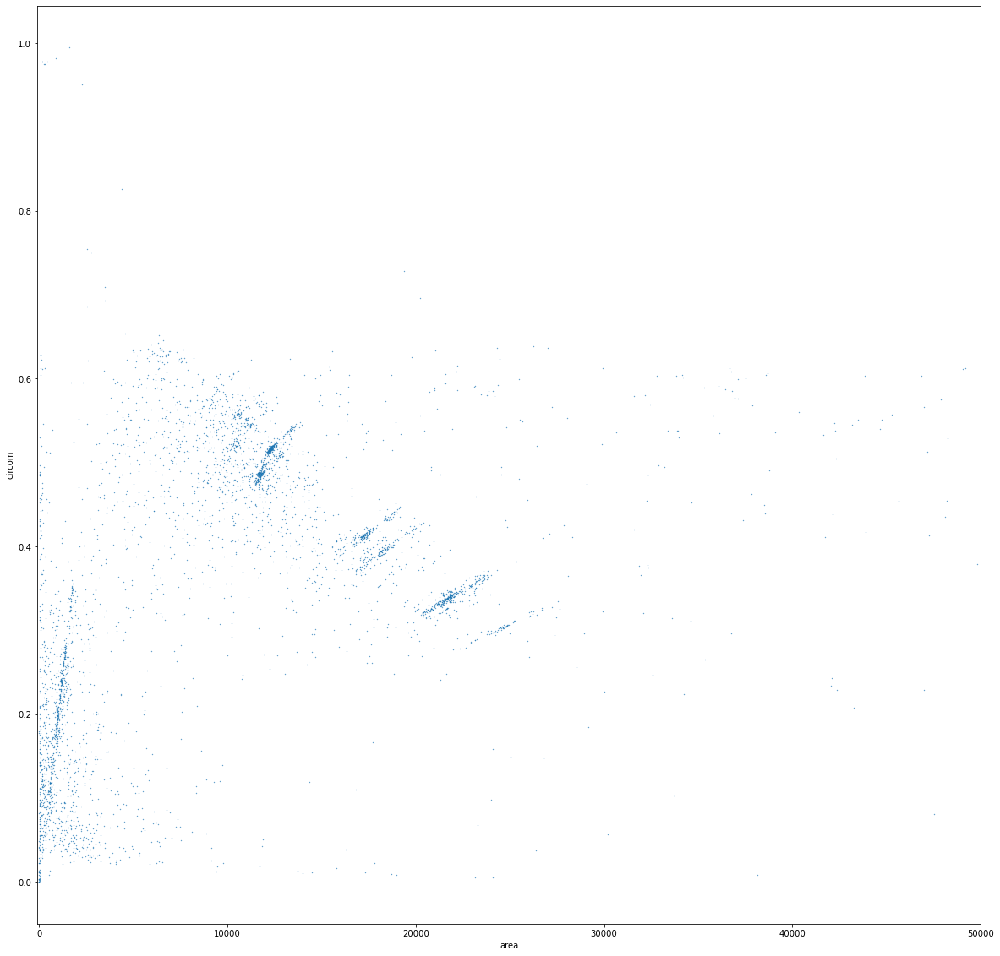

In [119]:
ax = polygons[['circom', 'area']].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
ax.set_xlim(-100, 50000)
# ax.set_ylim(0, 2500)

In [420]:
data = polygons[['area', 'circom']]

scaler = RobustScaler()
scaled = scaler.fit_transform(data)

In [124]:
db = DBSCAN(eps=.05, min_samples=10).fit(scaled)
np.unique(db.labels_, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 array([ 765, 1614,  343,   27,   43, 1214,   79,   12,   13,   10,   17,
          10]))

(-100.0, 20000.0)

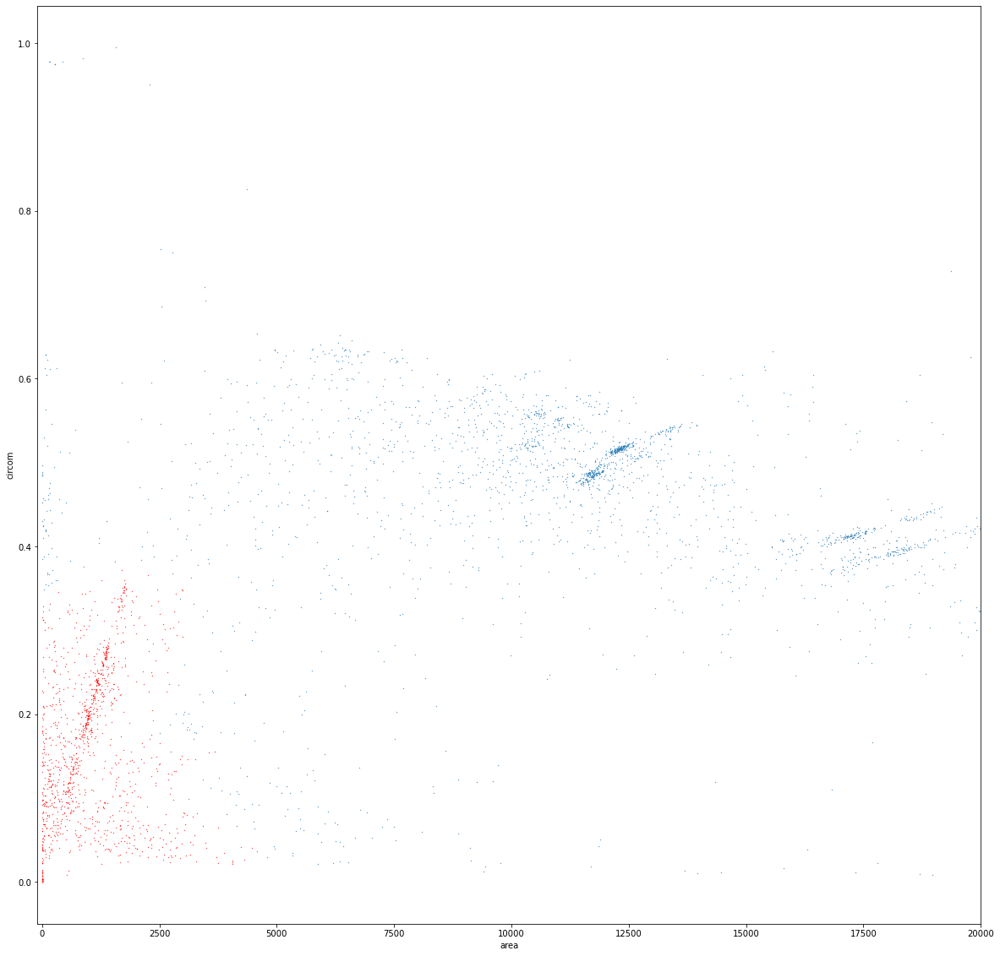

In [126]:
l = 4
ax = polygons[['circom', 'area']][db.labels_ != l].plot.scatter('area', 'circom', figsize=(20, 20), s=.1)
polygons[['circom', 'area']][db.labels_ == l].plot.scatter('area', 'circom', ax=ax, color='r', s=.1)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

<AxesSubplot:>

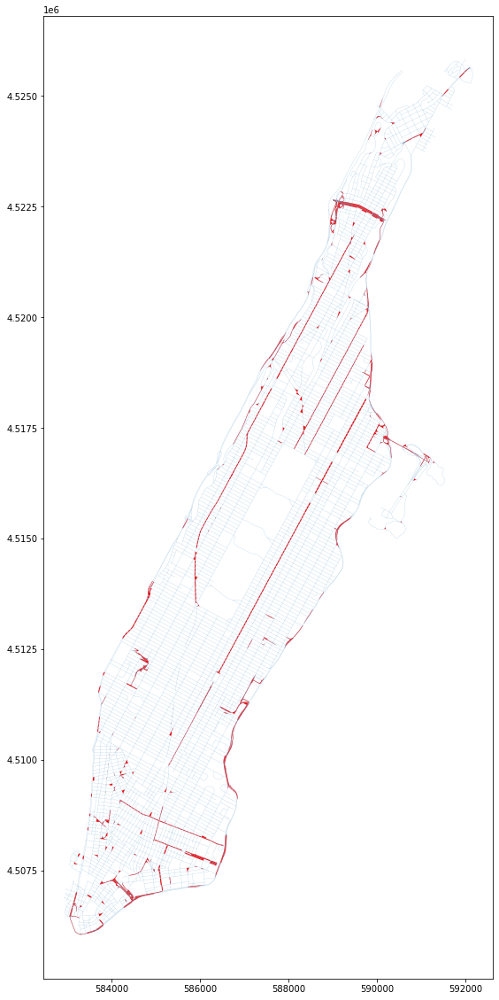

In [127]:
ax = polygons[db.labels_ == l].plot(figsize=(20, 20),color='r')
network_ny.plot(ax=ax, linewidth=.1)

### Derived

<AxesSubplot:ylabel='Frequency'>

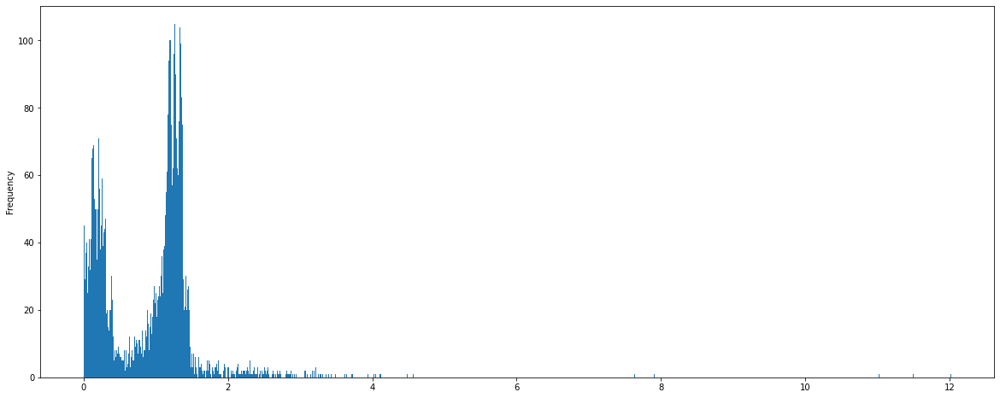

In [421]:
data = polygons[['area', 'circom']]

scaler = RobustScaler(with_centering=False)
scaled = scaler.fit_transform(data)

exp = 2

index = (scaled[:, 0] ** (1/exp)) * (scaled[:, 1] ** (1/exp))
pd.Series(index).plot.hist(figsize=(20, 8), bins=1000)

(-0.05, 2.0)

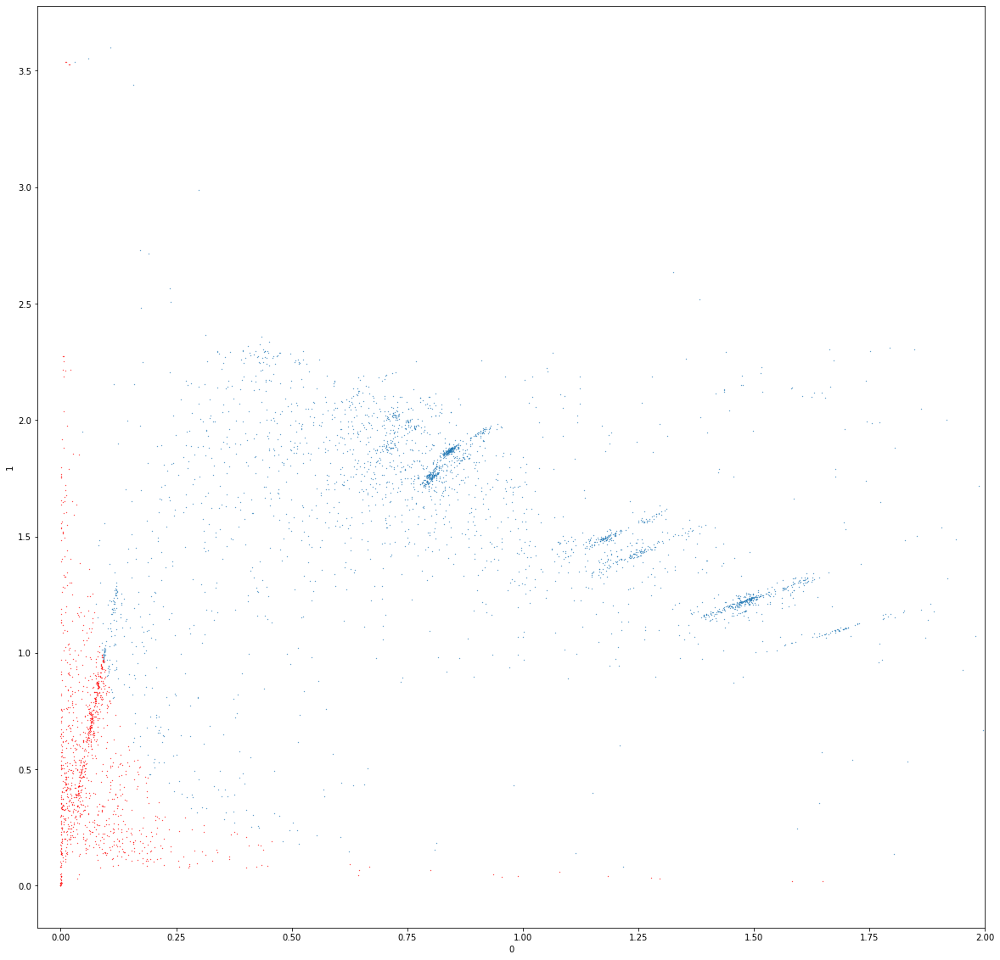

In [423]:
value = .3
ax = pd.DataFrame(scaled)[index > value].plot.scatter(0, 1, figsize=(20, 20), cmap='tab20', s=.1)
pd.DataFrame(scaled)[index < value].plot.scatter(0, 1, ax=ax, c='r', s=.1)
ax.set_xlim(-.05, 2)

<AxesSubplot:>

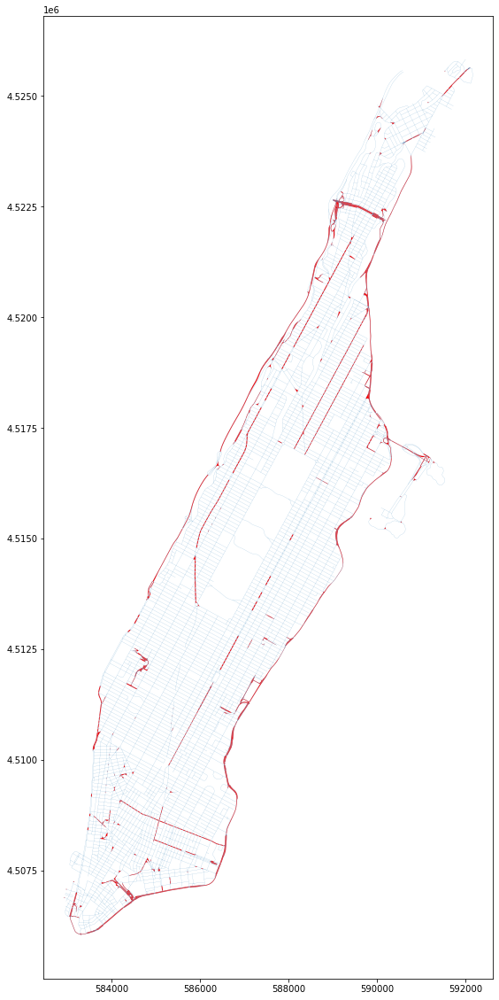

In [424]:
ax = polygons[index < value].plot(figsize=(20, 20),color='r')
network_ny.plot(ax=ax, linewidth=.1)